<font size="5">ライブラリのインポート

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import numpy as np
import matplotlib.pyplot as plt
import random
import math
import pandas as pd
import csv

<font size="5">cpuとgpuの選択

In [2]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "gpu")

<font size="5">乱数を特定の値にして再現性を確保

In [3]:
# For reproducibility
torch.manual_seed(42)
if use_cuda:
    torch.cuda.manual_seed(42)

<font size ="5">pytorch用データセットの作成

In [4]:
# Load MNIST dataset
# pytorchではTensorというデータ構造で、モデルの入力、出力、パラメータを表現
# 前処理の定義
"""
これから取得するDatasetの中身がndarray型のデータ集合であるため、前処理でtensor型にしたい

root
Datasetを参照(または保存)するディレクトリを「path」の部分に指定する.
そのディレクトリに取得したいDatasetが存在すればダウンロードせずにそれを使用する.

train
Training用のdataを取得するかどうかを選択する.
FalseにすればTest用のdataを取得するが,この2つの違いはdata数の違いと思ってくれて良い.

download
rootで参照したディレクトリにDatasetがない場合ダウンロードするかどうかを決めることができる.

transform
定義した前処理を渡す.
こうすることでDataset内のdataを参照する時にその前処理を自動で行ってくれる.
"""
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# 学習用データとテスト用データの取得
# transformは私用すると前処理を指定できる
# これによりdatasetをdetaloaderに渡して使える状態にした
train_dataset_original = datasets.FashionMNIST(root='./data', train=True, transform=transform, download=True)
print(f"Train Dataset Size: {len(train_dataset_original)}")
test_dataset_original = datasets.FashionMNIST(root='./data', train=False, transform=transform)
print(f"Test Dataset Size: {len(test_dataset_original)}")

Train Dataset Size: 60000
Test Dataset Size: 10000


C:\Users\y9723\anaconda3\lib\site-packages\torchvision\datasets\mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


<font size ="5">データの個数を調節

In [5]:
# traindata
# クラス数を取得
num_classes = len(train_dataset_original.classes)
print(num_classes)
print(len(train_dataset_original))
# 各クラスごとのデータ数を計算
desired_class_count = 3000  # 各クラスごとに均等に分割したいデータ数
total_desired_count = desired_class_count * num_classes

# クラスごとに均等にデータを分割するためのリストを作成
selected_indices_1 = []
selected_indices_2 = []

# 各クラスごとに均等にデータを選択
for class_idx in range(num_classes):
    class_indices = np.where(train_dataset_original.targets == class_idx)[0]
    np.random.shuffle(class_indices)
    selected_indices_1.extend(class_indices[:desired_class_count])
    selected_indices_2.extend(class_indices[desired_class_count:2*desired_class_count])

# 選択したデータで新しいデータセットを作成
train_data_1 = torch.utils.data.Subset(train_dataset_original, selected_indices_1)
train_data_2 = torch.utils.data.Subset(train_dataset_original, selected_indices_2)

# # 各クラスごとの新しいデータ数を確認
class_counts_subset_1 = np.bincount([train_dataset_original.targets[i] for i in selected_indices_1])
class_counts_subset_2 = np.bincount([train_dataset_original.targets[i] for i in selected_indices_2])

print("データセット1の各クラスごとの新しいデータ数:", class_counts_subset_1)
print("データセット2の各クラスごとの新しいデータ数:", class_counts_subset_2)

# testdata
# 2. データセット内のクラスごとのサンプル数を確認
class_count = [0] * 10# 10はFashionMNISTのクラス数です
sample_indices = []
for i in range(len(test_dataset_original)):
    _, target = test_dataset_original[i]
    if class_count[target] < 100:  # 各クラスから100サンプルまで抽出
        sample_indices.append(i)
        class_count[target] += 1

# 3. 均等に抽出されたサンプルから新しいデータセットを構築
test_data = torch.utils.data.Subset(test_dataset_original, sample_indices)

# 新しいデータセットを使用して必要な処理を実行

for i in range(len(test_data)):
    if class_count[target] < 100:  # 各クラスから100サンプルまで抽出
        sample_indices.append(i)
        class_count[target] += 1

# 各クラスごとのサンプル数を出力
for i, count in enumerate(class_count):
    print(f"クラス {i}: {count} 個のサンプル")
    
print(f"testデータの数：{len(test_data)}")

10
60000
データセット1の各クラスごとの新しいデータ数: [3000 3000 3000 3000 3000 3000 3000 3000 3000 3000]
データセット2の各クラスごとの新しいデータ数: [3000 3000 3000 3000 3000 3000 3000 3000 3000 3000]
クラス 0: 100 個のサンプル
クラス 1: 100 個のサンプル
クラス 2: 100 個のサンプル
クラス 3: 100 個のサンプル
クラス 4: 100 個のサンプル
クラス 5: 100 個のサンプル
クラス 6: 100 個のサンプル
クラス 7: 100 個のサンプル
クラス 8: 100 個のサンプル
クラス 9: 100 個のサンプル
testデータの数：1000


<font size ="5">Siamese Network用MNISTデータセットクラスの作成

In [6]:
# Siamese Network用MNISTデータセットクラスの作成
class SiameseMNIST(Dataset):
    def __init__(self, dataset):
        self.dataset=dataset
        self.length=len(self.dataset)
        self.pair_index=[]     # Siamese Net用画像ペアインデックス配列
        labels=[label for _, label in self.dataset]     # 入力されたデータセットからラベル情報のみ抽出
        positive_count=0     # positiveペアのカウント
        negative_count=0     # negativeペアのカウント
        random_index=np.arange(self.length)     # ？？？
        
        while positive_count + negative_count < self.length:
            np.random.shuffle(random_index)
            for i in np.arange(self.length):
                if labels[i]==labels[random_index[i]]:     # 画像ペアのラベルが等しい時（positive）
                    if positive_count<self.length/2:      # おそらく比率を同じにしたい？？
                        self.pair_index.append([i, random_index[i], 1])      # 要素の構成：[<画像1のインデックス>,<画像2のインデックス>,<posi:1/nega:0フラグ>]
                        positive_count+=1
                    else:
                        continue
                else:
                    if negative_count<self.length/2:
                        self.pair_index.append([i, random_index[i], 0])
                        negative_count+=1
                    else:
                        continue
#         print("com", self.pair_index)
    def __len__(self):
        return self.length

    def __getitem__(self, index):

        return self.dataset[self.pair_index[index][0]][0], self.dataset[self.pair_index[index][1]][0], torch.tensor(self.pair_index[index][2])

<font size ="5">Siamese Network学習用Dataset, DataLoaderの作成

In [7]:
batch_size=64
# 1 学習用
# train_dataset_1=SiameseMNIST(train_data_1) 
# train_data_learn=DataLoader(train_dataset_1, batch_size=batch_size, shuffle=True)
# # # 2 写像用(領域作成用)
# # train_data_projection=DataLoader(train_data_2, batch_size=1, shuffle=True)
# 3 テスト用
# test_loader=DataLoader(test_data, batch_size=1, shuffle=True)

batch_size=64
train_dataset=SiameseMNIST(train_dataset_original) 
train_loader=DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
train_loader_prime=DataLoader(train_dataset_original, batch_size=1, shuffle=False)

In [8]:
test_loader=DataLoader(test_data, batch_size=1, shuffle=False)

<font size ="5">ペア画像の確認

torch.Size([1, 28, 28])
y[0]=0
y[1]=1
y[2]=1
y[3]=1
y[4]=1
y[5]=1
y[6]=1
y[7]=0
y[8]=0
y[9]=0


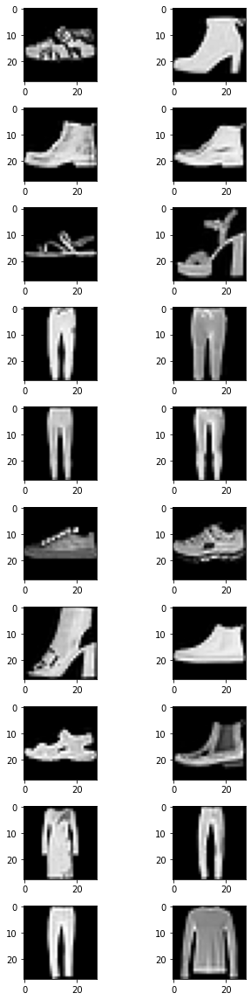

In [9]:
X1, X2, y = next(iter(train_loader))
print(X1[0].shape)
fig=plt.figure(tight_layout=True, figsize=(8, 16))
rows=10
for i in range(rows):
    print(f"y[{i}]={y[i]}")
    ax = fig.add_subplot(rows, 2, i*2+1)
    ax.imshow(X1[i][0].numpy(), cmap='gray')                          # X1[i].shape = (1, 28, 28)，X1[i][0].shape = (28, 28)
    ax = fig.add_subplot(rows, 2, i*2+2)
    ax.imshow(X2[i][0].numpy(), cmap='gray') 

<font size="5">モデルの構築

super()はあるクラス（子クラス）で別のクラス（親クラス）を継承できる。継承することで、親クラスのメソッドを子クラスから呼び出すことができる。
以下の形式
super().親クラスのメソッド

In [10]:
class BaseNetwork(nn.Module):
    """
    Base network for Siamese Network.
    This will be shared between two input images.
    """
    def __init__(self):
        super().__init__()

        # Define the layers
        # Using similar architecture as in the Keras example

        # First Convolutional Layer
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.act1 = nn.ReLU()
        self.maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Second Convolutional Layer
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.act2 = nn.ReLU()
        self.maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        # Flatten and Dense Layers
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * 7 * 7, 128)  # Assuming input image size is 28x28
        self.act3 = nn.ReLU()
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(128, 256)
        self.act4 = nn.ReLU()

    def forward_1(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.act1(x)
        x = self.maxpool1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.act2(x)
        x = self.maxpool2(x)

        x = self.flatten(x)
        x = self.fc1(x)
        x = self.act3(x)
        x = self.dropout(x)
        x = self.fc2(x)
#         print("xのshape",x)
        x = self.act4(x)

        return x

    def forward(self, x1,x2):
        z1=self.forward_1(x1)
        z2=self.forward_1(x2)
        return z1,z2

# Test the base network with a sample input
base_network = BaseNetwork().to(device)
sample_input = torch.randn(8, 1, 28, 28).to(device)  # Batch of 8 images of sizammm28x28 with 1 channel
sample_output = base_network.forward_1(sample_input)

sample_output.shape  # Expected: [8, 256]


C:\Users\y9723\anaconda3\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


torch.Size([8, 256])

In [11]:
# Siamse Networkモデルクラス
import torch.nn as nn

class SiameseCNNMnistModel(nn.Module):
    
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=5, padding=2), # 28x28x32
            nn.ReLU(),
            nn.MaxPool2d(2,2),                         # 14x14x32
            nn.Conv2d(32, 64, kernel_size=5, padding=2),# 14x14x64
            nn.ReLU(),
            nn.MaxPool2d(2,2)                          # 7x7x64
        )

        # Fully connected layers to get embeddings
        self.fc = nn.Sequential(
            nn.Linear(7*7*64, 256),
            nn.ReLU(),
            nn.Linear(256, 3)
        )
    
    def forward_once(self, x):
        x = self.encoder(x)
        x = x.view(x.size()[0], -1)  # Flatten
        z = self.fc(x)
        return z
  
    def forward(self, x1, x2):
        z1 = self.forward_once(x1)
        z2 = self.forward_once(x2)
        return z1, z2


<font size="5">損失関数

In [12]:
# 損失関数
class ContrastiveLoss(nn.Module):
    def __init__(self, margin=2.5):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, z1, z2, y):
        difference = z1 - z2
        distance_squared = torch.sum(torch.pow(difference, 2), 1)
        distance = torch.sqrt(distance_squared)       #平均：0.813，最大：1.663，最小：0.023，中央値：0.492
        negative_distance = self.margin - distance
        negative_distance = torch.clamp(negative_distance, min=0.0)
        loss = (abs(y) * (distance_squared+2) + abs(1 - abs(y)) * torch.pow(negative_distance, 2)) / 2.0
        loss = torch.sum(loss) / z1.size()[0]
        return loss

<font size ="5">使用関数の一覧実行

<font size ="5">学習の準備

In [13]:
import torch.optim as optim
from torchsummary import summary

#モデルのインスタンス化
model=SiameseCNNMnistModel().to(device)
print(model.parameters)
# ？？？？
summary(model, input_size=[(1, 28, 28), (1, 28, 28)])      # 入力が２つあるので（ペア画像だから）input_sizeはリストで複数指定する

# 最適化関数の定義
optimizer=optim.SGD(model.parameters(), lr=0.05)

# 損失関数のインスタンス化
criterion=ContrastiveLoss()

<bound method Module.parameters of SiameseCNNMnistModel(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc): Sequential(
    (0): Linear(in_features=3136, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=3, bias=True)
  )
)>
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 32, 28, 28]             832
              ReLU-2           [-1, 32, 28, 28]               0
         MaxPool2d-3           [-1, 32, 14, 14]               0
            Conv2d-4           [-1, 64, 14, 14]          51,264
              

<font size ="5">学習の実行

In [14]:
# import copy
# import matplotlib.pyplot as plt
# from tqdm.notebook import tqdm

# # モデル学習
# repeat = 60                                                      # 学習回数
# losses = []                                                       # 表示用損失値配列

# model.train()                                                     # 学習モード
# for epoch in range(repeat): 
#   print(f"epoch={epoch}")
#   nan_count = 0
#   normal_count = 0




#   # tqdmを使って学習の進行状況を表示
#   for X1, X2, y in tqdm(train_loader, desc=f"Epoch {epoch+1}/{repeat}"):                                  
#     # モデルによる特徴ベクトル算出
#     output1, output2 = model(X1.to(device), X2.to(device))

#     # 損失関数の計算
#     loss = criterion(output1, output2, y.to(device))

#     # nan対策（lossにnanが含まれていれば１回前のモデルに戻す）
#     if torch.isnan(loss):
#       model = prev_model
#       optimizer = optim.SGD(model.parameters(), lr=0.05)
#       optimizer.load_state_dict(prev_optimizer.state_dict())
#       nan_count += 1
#       continue
#     else:
#       prev_model = copy.deepcopy(model)
#       prev_optimizer = copy.deepcopy(optimizer)
#       normal_count += 1

#     # 表示用lossデータの記録
#     losses.append(loss.item())

#     # 勾配を初期化
#     optimizer.zero_grad()
    
#     # 損失関数の値から勾配を求め誤差逆伝播による学習実行
#     loss.backward()
    
#     # 学習結果に基づきパラメータを更新
#     optimizer.step()

#   print(f"nan/normal: {nan_count}/{normal_count}")
# plt.plot(losses)                                                  # loss値の推移を表示


<font size ="5">学習結果の保存

In [15]:
# torch.save(model.state_dict(), 'model_weights_Epochs_60_Margin_2_5_Alpha_02.pth')

<font size ="5">学習済みの重みを再利用する場合

In [16]:
model.load_state_dict(torch.load('model_weights_epochs_60_margin_2.5.pth'))

<All keys matched successfully>

<font size ="5">モデルの出力ベクトルの取得

モデル学習の結果、同じクラスに属する画像の出力ベクトルは近くに、異なる数字に属する画像の出力ベクトルは遠くに配置されているはず。
これを確認するために、テストデータを用いて出力ベクトルを集める。
model.eval()で評価モードに設定し、変数の勾配も再計算されないようにtorch.no_grid()を記述する。

In [17]:
# モデル評価
model.eval()                                                      # 評価モード
with torch.no_grad():
    z_valid = []
    y_valid = []
    for X, y in train_loader_prime:                                      # テスト用DataLoader
        z_valid.append(model.forward_once(X.to(device)))           # テストデータをモデルに通して出力ベクトルを得る
        y_valid.append(y)                                          # ラベル（靴、シャツ）の代わりにラベルIDとして0～9の数代わり振られている
    z_valid = torch.cat(z_valid, dim=0)                             # 多次元torch.tensor要素のリストをtorch.tensor化
    y_valid = torch.tensor(y_valid)                                 # スカラ要素(int)リストをtorch.tensor化

In [18]:
# 次元数の確認
print(z_valid.size())
print(y_valid.size())

torch.Size([60000, 3])
torch.Size([60000])


z_testとy_testをGPUに移動

In [19]:
# GPUが利用可能かチェック
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

# z_validとy_validをGPUに移動
z_valid = z_valid.to(device)
y_valid = y_valid.to(device)
# ndarrayに変換
z_valid_np = z_valid.to('cpu').detach().numpy().copy()
y_valid_np = y_valid.to('cpu').detach().numpy().copy()
print(z_valid_np.shape)
print(y_valid_np.shape)

(60000, 3)
(60000,)


<font size="5">モデル出力ベクトルの分布可視化

<IPython.core.display.Javascript object>


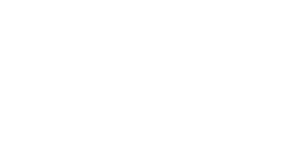

In [20]:
%matplotlib notebook
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# クラス名
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
# クラス数
class_num=len(class_names)
# 事前に定義された10色のリスト
colors = ["blue","green","red","cyan","magenta","yellow","black",'purple','#a65628','#ff7f00']
# figureを生成する
plt.figure(figsize=(10, 10))
# axをfigureに設定する
ax = plt.subplot(111, projection='3d')
# クラスごとに色を分けてプロット
for i in range(class_num):    ax.scatter(z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2], color=colors[i], label=class_names[i])
ax.legend()  # 凡例の追加
plt.show()

分散の算出

In [21]:
z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2]
# 分散
variance=np.zeros((class_num))

# print(z_valid_np[y_valid_np==0].shape)
for i in range(class_num):
    variance[i]=np.min(np.var(z_valid_np[y_valid_np==i], axis=0), axis=0)
#     print(variance[i])
variance

array([0.05247046, 0.00954384, 0.0774831 , 0.04525571, 0.06263208,
       0.01614965, 0.09755592, 0.01955811, 0.01766576, 0.01332599])

In [22]:
min_value = np.min(variance)
max_value = np.max(variance)

# 正規化
normalized_values = (variance - min_value) / (max_value - min_value)

print(normalized_values)

[0.48773558 0.         0.77193102 0.40576094 0.6031926  0.07505571
 1.         0.11378285 0.0922819  0.0429731 ]


In [23]:
0.9*500

450.0

<font size="5">判定領域作成関数

判定領域作成のステップを以下に示す   
１．ノイズクラスタリングにより算出した重心を可視化→処理時間がかかるためデータ数を減らして行う？  
２．重心から領域を広げていく（同心円状に安全マージンの導入をしてみてもいいかも）  
３．重心内の含有量を算出し、一定値以上となった場合広げるのをやめる  
４．以上により三次元空間の判定領域を作成     
→同心円状の場合は、判定領域内かどうかは半径と点同士の距離を測定して算出が可能  

<font size="5">testデータで性能判定

1. CNNから(3,)の出力を受け取る
2, 各クラスタとの距離を算出して最小のものを選択→半径以内かどうか判定（二十判定、判定がない場合に予測不可とする）

In [24]:
# モデル評価
model.eval()                                                      # 評価モード
with torch.no_grad():
    z_test = []
    y_test = []
    for X, y in test_loader:                                      # テスト用DataLoader
#         print(X)
        print(y)
        z_test.append(model.forward_once(X.to(device)))           # テストデータをモデルに通して出力ベクトルを得る
        y_test.append(y)                                          # ラベル（靴、シャツ）の代わりにラベルIDとして0～9の数代わり振られている
    z_test = torch.cat(z_test, dim=0)                             # 多次元torch.tensor要素のリストをtorch.tensor化
    y_test = torch.tensor(y_test)

# z_testとy_testをGPUに移動
z_test = z_test.to(device)
y_test = y_test.to(device)
# ndarrayに変換
z_test_np = z_test.to('cpu').detach().numpy().copy()
y_test_np = y_test.to('cpu').detach().numpy().copy()
print(z_test_np.shape)
print(y_test_np.shape)

tensor([9])
tensor([2])
tensor([1])
tensor([1])
tensor([6])
tensor([1])
tensor([4])
tensor([6])
tensor([5])
tensor([7])
tensor([4])
tensor([5])
tensor([7])
tensor([3])
tensor([4])
tensor([1])
tensor([2])
tensor([4])
tensor([8])
tensor([0])
tensor([2])
tensor([5])
tensor([7])
tensor([9])
tensor([1])
tensor([4])
tensor([6])
tensor([0])
tensor([9])
tensor([3])
tensor([8])
tensor([8])
tensor([3])
tensor([3])
tensor([8])
tensor([0])
tensor([7])
tensor([5])
tensor([7])
tensor([9])
tensor([6])
tensor([1])
tensor([3])
tensor([7])
tensor([6])
tensor([7])
tensor([2])
tensor([1])
tensor([2])
tensor([2])
tensor([4])
tensor([4])
tensor([5])
tensor([8])
tensor([2])
tensor([2])
tensor([8])
tensor([4])
tensor([8])
tensor([0])
tensor([7])
tensor([7])
tensor([8])
tensor([5])
tensor([1])
tensor([1])
tensor([2])
tensor([3])
tensor([9])
tensor([8])
tensor([7])
tensor([0])
tensor([2])
tensor([6])
tensor([2])
tensor([3])
tensor([1])
tensor([2])
tensor([8])
tensor([4])
tensor([1])
tensor([8])
tensor([5])
tens

tensor([4])
tensor([5])
tensor([0])
tensor([9])
tensor([5])
tensor([3])
tensor([6])
tensor([6])
tensor([8])
tensor([3])
tensor([3])
tensor([8])
tensor([1])
tensor([4])
tensor([0])
tensor([9])
tensor([7])
tensor([9])
tensor([4])
tensor([8])
tensor([9])
tensor([1])
tensor([6])
tensor([7])
tensor([3])
tensor([0])
tensor([2])
tensor([6])
tensor([7])
tensor([1])
tensor([0])
tensor([0])
tensor([8])
tensor([5])
tensor([2])
tensor([6])
tensor([6])
tensor([6])
tensor([4])
tensor([1])
tensor([5])
tensor([9])
tensor([0])
tensor([2])
tensor([1])
tensor([6])
tensor([5])
tensor([0])
tensor([0])
tensor([3])
tensor([3])
tensor([3])
tensor([8])
tensor([1])
tensor([1])
tensor([8])
tensor([5])
tensor([7])
tensor([7])
tensor([8])
tensor([7])
tensor([2])
tensor([0])
tensor([7])
tensor([3])
tensor([8])
tensor([0])
tensor([9])
tensor([7])
tensor([6])
tensor([1])
tensor([2])
tensor([6])
tensor([4])
tensor([8])
tensor([0])
tensor([6])
tensor([3])
tensor([6])
tensor([8])
tensor([4])
tensor([0])
tensor([8])
tens

In [25]:
z_test_np

array([[ 2.9295557 , -0.74145657,  2.1242862 ],
       [ 1.0063643 , -0.07813258, -2.9804864 ],
       [-3.533734  ,  1.2906208 ,  0.26033965],
       ...,
       [ 1.5859826 ,  0.11268897,  0.09419998],
       [ 0.38301203, -1.5298743 ,  2.188566  ],
       [ 0.3695266 , -1.3146259 ,  1.9520857 ]], dtype=float32)

In [26]:
y_test_np

array([9, 2, 1, 1, 6, 1, 4, 6, 5, 7, 4, 5, 7, 3, 4, 1, 2, 4, 8, 0, 2, 5,
       7, 9, 1, 4, 6, 0, 9, 3, 8, 8, 3, 3, 8, 0, 7, 5, 7, 9, 6, 1, 3, 7,
       6, 7, 2, 1, 2, 2, 4, 4, 5, 8, 2, 2, 8, 4, 8, 0, 7, 7, 8, 5, 1, 1,
       2, 3, 9, 8, 7, 0, 2, 6, 2, 3, 1, 2, 8, 4, 1, 8, 5, 9, 5, 0, 3, 2,
       0, 6, 5, 3, 6, 7, 1, 8, 0, 1, 4, 2, 3, 6, 7, 2, 7, 8, 5, 9, 9, 4,
       2, 5, 7, 0, 5, 2, 8, 6, 7, 8, 0, 0, 9, 9, 3, 0, 8, 4, 1, 5, 4, 1,
       9, 1, 8, 6, 2, 1, 2, 5, 1, 0, 0, 0, 1, 6, 1, 6, 2, 2, 4, 4, 1, 4,
       5, 0, 4, 7, 9, 3, 7, 2, 3, 9, 0, 9, 4, 7, 4, 2, 0, 5, 2, 1, 2, 1,
       3, 0, 9, 1, 0, 9, 3, 6, 7, 9, 9, 4, 4, 7, 1, 2, 1, 6, 3, 2, 8, 3,
       6, 1, 1, 0, 2, 9, 2, 4, 0, 7, 9, 8, 4, 1, 8, 4, 1, 3, 1, 6, 7, 2,
       8, 5, 2, 0, 7, 7, 6, 2, 7, 0, 7, 8, 9, 2, 9, 0, 5, 1, 4, 4, 5, 6,
       9, 2, 6, 8, 6, 4, 2, 2, 9, 7, 6, 5, 5, 2, 8, 5, 2, 3, 0, 4, 8, 0,
       0, 6, 3, 8, 9, 6, 1, 3, 0, 2, 3, 0, 8, 3, 7, 4, 0, 1, 6, 3, 0, 6,
       6, 7, 5, 4, 5, 9, 5, 6, 5, 5, 1, 9, 8, 8, 3,

<class 'numpy.ndarray'>
(1, 28, 28)
<class 'numpy.ndarray'>
(3,)


<IPython.core.display.Javascript object>


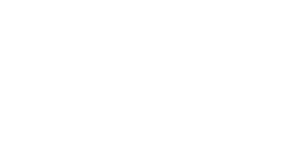

Label: 9


In [27]:
# 134番目の画像を取得
index = 0
image = test_loader.dataset[index][0]
label = test_loader.dataset[index][1]

# 画像を28x28からより小さなサイズに変更
npimg = image.numpy()
print(type(npimg))
print(npimg.shape)
print(type(z_test_np[134]))
print(z_test_np[134].shape)
npimg = npimg.reshape((28, 28))

# 図のサイズを設定
plt.figure(figsize=(1, 1))

# 出力画像の解像度を上げるためにinterpolationパラメータを指定
plt.imshow(npimg, cmap='gray', interpolation='bilinear')

print('Label:', label)
# print(y_test_np[134])
plt.show()  # 図を表示


<font size="5">testデータに対して判定領域を作成

判定領域作成のステップを以下に示す   
１．testデータを受け取る  
２．testデータからの距離（球、立方体）の領域を獲得、その条件に合うデータを取ってきて、ラベルを確認する  
３．ラベルから領域判定条件を設定する。し、解答を算出

①normal

In [28]:
# 格納用
data=[]
# level0がより左側のインデックスで、階層は上のインデックス
test_radius=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 1]
string_test_radius = [str(radius) for radius in test_radius for _ in range(3)]
# print(string_test_radius)
# level0
level0=string_test_radius
# 予測ラベル格納
predictions=np.zeros((z_test_np.shape[0],))
z_test_np
# 複製の作成
sub_y_test=y_test_np.copy()
# 割合パラメータ（50, 60, 70, 80, 90, 95）
para=60
# 四角形を作ってから、球状判定領域を作成
array=np.array(z_valid_np.shape)
percentage=np.empty(10)

label_ans = ["正解", "不正解", "解答不可"]
# test_radiusの値の数に応じてパターンを増やす
level1 = [label_ans[j] for i in range(len(test_radius)) for j in range(len(label_ans))]
indices = [level0, level1]
# print(indices)

# データの整理

for index in range(len(test_radius)):
    for l in range(z_test_np.shape[0]):
        # 四角形内か否かを判定
        array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
        array1=array.all(axis=1)
    #     print(array1.shape)
    #     print(array1)
        array2=z_valid_np[array1]   
    #     print(array2.shape)
        # totalの計算
        total_elements=array2.shape[0]
        # labelの確認
        array3=y_valid_np[array1]
    #     print(type(array3))
        counts=np.bincount(array3, minlength=10)
        var_counts=np.copy(counts)
        # 結果の表示
        # 11/26：分散の導入
#         print(counts.shape)
        for i in range(class_num):
            var_counts=counts/variance[i]
        for i in range(10):
            percentage[i] = (counts[i] / total_elements) * 100
    #         print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
    #     print("--------------------------------------------------------------------")
        # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
        #     条件分岐
        max_value = np.max(percentage)
    #     print(f"max_value:{max_value}")
        max_index = np.argmax(percentage)
    #     print(f"max_index:{max_index}")
        if para < max_value and total_elements!=0:
            predictions[l]=max_index
        else:
            predictions[l]=10 # 最小半径異常の距離の場合分類不可とする
        
    # クラスの数とクラスの名前を定義
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    class_num = len(class_names)

    # ラベルごとの正解、不正解、解答不能のカウントを辞書として初期化
    label_counts = {class_names[label]: {"correct": 0, "incorrect": 0, "unanswerable": 0} for label in range(class_num)}

    # 予測と正解ラベルを比較し、各ラベルのカウントを更新
    for i in range(len(predictions)):
        prediction = predictions[i]
        label = y_test_np[i]

        if prediction == label:
            label_name = class_names[label]
            label_counts[label_name]["correct"] += 1
        elif prediction == 10:
            label_name = class_names[label]
            label_counts[label_name]["unanswerable"] += 1
            sub_y_test[i] = 10
        else:
            label_name = class_names[label]
            label_counts[label_name]["incorrect"] += 1
            
    # dataに格納（三周するはずその間に（10,3）を三回）
    label_2=["correct", "incorrect", "unanswerable"]
    arr=np.zeros(10)
    for j in range(len(label_2)):
        for i in range(len(class_names)):
            arr[i]=label_counts[class_names[i]][label_2[j]]
#             print(arr[i])
        arr2=arr.tolist()
        data.append(arr2)
    data2=np.array(data)
#     print(data2)

int_data=data2.astype(int)
column =  ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
print(column)
df = pd.DataFrame(int_data, index=indices, columns=column)
df

C:\Users\y9723\anaconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in longlong_scalars


['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


T-shirt/top  Trouser  Pullover  Dress  Coat  Sandal  Shirt  Sneaker  \
0.1 正解             80       96        79     79    74      96     69       97   
    不正解            11        2        15      9    11       0     16        1   
    解答不可            9        2         6     12    15       4     15        2   
0.2 正解             82       98        79     83    79     100     70       96   
    不正解             9        1        14      8    10       0     17        2   
    解答不可            9        1         7      9    11       0     13        2   
0.3 正解             83       98        80     84    81      99     70       96   
    不正解            11        1        15      7    10       0     19        2   
    解答不可            6        1         5      9     9       1     11        2   
0.4 正解             82       98        81     85    81     100     68       96   
    不正解            12        1        15      7    11       0     21        2   
    解答不可            6        1         4      8     8       0     11        2   
0.5 正解             85       99        81     85    80     100     66       96   
    不正解            10        1        15      7    11       0     21        3   
    解答不可            5        0         4      8     9       0     13        1   
0.6 正解             85       99        81     85    79     100     66       97   
    不正解            10        1        14      6    11       0     20        3   
    解答不可            5        0         5      9    10       0     14        0   
0.7 正解             85       99        81     85    78     100     63       97   
    不正解            11        1        13      6    11       0     19        3   
    解答不可            4        0         6      9    11       0     18        0   
0.8 正解             85       99        78     85    78     100     59       97   
    不正解            11        1        12      5     8       0     17        3   
    解答不可            4        0        10     10    14       0     24        0   
1   正解             82       99        70     85    68     100     37       97   
    不正解             8        1         7      6     6       0     12        2   
    解答不可           10        0        23      9    26       0     51        1   

          Bag  Ankle boot  
0.1 正解     93          96  
    不正解     0           4  
    解答不可    7           0  
0.2 正解     97          95  
    不正解     0           4  
    解答不可    3           1  
0.3 正解     97          95  
    不正解     1           4  
    解答不可    2           1  
0.4 正解     97          95  
    不正解     1           4  
    解答不可    2           1  
0.5 正解     97          95  
    不正解     2           3  
    解答不可    1           2  
0.6 正解     97          95  
    不正解     2           3  
    解答不可    1           2  
0.7 正解     97          96  
    不正解     1           3  
    解答不可    2           1  
0.8 正解     97          96  
    不正解     2           4  
    解答不可    1           0  
1   正解     97          95  
    不正解     1           3  
    解答不可    2           2

In [29]:
# 格納用
data=[]
uncorrect_data=[]
# level0がより左側のインデックスで、階層は上のインデックス
test_radius=[0.4]
string_test_radius = [str(radius) for radius in test_radius for _ in range(3)]
# print(string_test_radius)
# level0
level0=string_test_radius
# 予測ラベル格納
predictions=np.zeros((z_test_np.shape[0],))
z_test_np
# 複製の作成
sub_y_test=y_test_np.copy()
number_data=np.zeros((z_test_np.shape[0],))
correct_nucorrect=np.zeros((z_test_np.shape[0],))
# 割合パラメータ（50, 60, 70, 80, 90, 95）
para=60
# 四角形を作ってから、球状判定領域を作成
array=np.array(z_valid_np.shape)
percentage=np.empty(10)

label_ans = ["正解", "不正解", "解答不可"]
# test_radiusの値の数に応じてパターンを増やす
level1 = [label_ans[j] for i in range(len(test_radius)) for j in range(len(label_ans))]
indices = [level0, level1]
# print(indices)

# データの整理

for index in range(1):
    for l in range(z_test_np.shape[0]):
        # 四角形内か否かを判定
        array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
        array1=array.all(axis=1)
#         print(array1.shape)
    #     print(array1)
        array2=z_valid_np[array1]   
#         print(array2.shape[0])
        number_data[l]=array2.shape[0]
        # totalの計算
        total_elements=array2.shape[0]
        # labelの確認
        array3=y_valid_np[array1]
    #     print(type(array3))
        counts=np.bincount(array3, minlength=10)
#         var_counts=np.copy(counts)
        # 結果の表示
        # 11/26：分散の導入
#         print(counts.shape)
#         for i in range(class_num):
#             var_counts[i] = counts[i] / variance[i]
        for i in range(10):
            percentage[i] = (counts[i] / total_elements) * 100
            print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
        print("--------------------------------------------------------------------")
        # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
        #     条件分岐
        max_value = np.max(percentage)
        print(f"max_value:{max_value}")
        max_index = np.argmax(percentage)
        print(f"max_index:{max_index}")
        if para < max_value and total_elements != 0:
            predictions[l]=max_index
        else:
            predictions[l]=10 # 最小半径異常の距離の場合分類不可とする
    
    number_data=number_data.astype(int)
    # クラスの数とクラスの名前を定義
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    class_num = len(class_names)

    # ラベルごとの正解、不正解、解答不能のカウントを辞書として初期化
    label_counts = {class_names[label]: {"correct": 0, "incorrect": 0, "unanswerable": 0} for label in range(class_num)}

    # 予測と正解ラベルを比較し、各ラベルのカウントを更新
    for i in range(len(predictions)):
        prediction = predictions[i]
        label = y_test_np[i]

        if prediction == label:
            # 代入（可視化用）
            correct_nucorrect[i]=0
            label_name = class_names[label]
            label_counts[label_name]["correct"] += 1
        elif prediction == 10:
            # 代入（可視化用）
            correct_nucorrect[i]=2
            label_name = class_names[label]
            label_counts[label_name]["unanswerable"] += 1
            sub_y_test[i] = 10
        else:
            # 代入（可視化用）
            correct_nucorrect[i]=1
            label_name = class_names[label]
            label_counts[label_name]["incorrect"] += 1
            # 不正解を見たい
            uncorrect_data.append(i)
#     print(uncorrect_data)
#     print(len(uncorrect_data))
            
    # dataに格納（三周するはずその間に（10,3）を三回）
    label_2=["correct", "incorrect", "unanswerable"]
    arr=np.zeros(10)
    for j in range(len(label_2)):
        for i in range(len(class_names)):
            arr[i]=label_counts[class_names[i]][label_2[j]]
#             print(arr[i])
        arr2=arr.tolist()
        data.append(arr2)
    data2=np.array(data)
#     print(data2)

int_data=data2.astype(int)
column =  ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
print(column)
df = pd.DataFrame(int_data, index=indices, columns=column)
df

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 13 回出現しました。割合は 0.24% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 5466 回出現しました。割合は 99.74% です。
--------------------------------------------------------------------
max_value:99.74452554744525
max_index:9
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 928 回出現しました。割合は 98.72% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 6 回出現しました。割合は 0.64% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 6 回出現しました。割合は 0.64% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:98.72340425531915
max_index:2
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5780 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラ

クラス 0 は 118 回出現しました。割合は 16.16% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 6 回出現しました。割合は 0.82% です。
クラス 3 は 14 回出現しました。割合は 1.92% です。
クラス 4 は 3 回出現しました。割合は 0.41% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 589 回出現しました。割合は 80.68% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:80.68493150684931
max_index:6
クラス 0 は 2 回出現しました。割合は 0.97% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 6 回出現しました。割合は 2.90% です。
クラス 3 は 64 回出現しました。割合は 30.92% です。
クラス 4 は 110 回出現しました。割合は 53.14% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 24 回出現しました。割合は 11.59% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 1 回出現しました。割合は 0.48% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:53.14009661835749
max_index:4
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。


--------------------------------------------------------------------
max_value:98.9795918367347
max_index:2
クラス 0 は 4476 回出現しました。割合は 95.19% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 7 回出現しました。割合は 0.15% です。
クラス 3 は 3 回出現しました。割合は 0.06% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 216 回出現しました。割合は 4.59% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:95.19353466609954
max_index:0
クラス 0 は 13 回出現しました。割合は 1.58% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 667 回出現しました。割合は 81.24% です。
クラス 3 は 2 回出現しました。割合は 0.24% です。
クラス 4 は 16 回出現しました。割合は 1.95% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 121 回出現しました。割合は 14.74% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 2 回出現しました。割合は 0.24% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:81.24238733252132
max_index:2
クラス 0 は 0 回出現しました。割合

クラス 0 は 1 回出現しました。割合は 0.07% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 41 回出現しました。割合は 2.92% です。
クラス 3 は 7 回出現しました。割合は 0.50% です。
クラス 4 は 1220 回出現しました。割合は 86.83% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 136 回出現しました。割合は 9.68% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:86.83274021352312
max_index:4
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5804 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.98277347114556
max_index:1
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 4 回出現しました。割合は 1.14% です。
クラス 3 は 321 回出現しました。割合は 91.71% です。


クラス 0 は 7 回出現しました。割合は 0.15% です。
クラス 1 は 5 回出現しました。割合は 0.11% です。
クラス 2 は 2 回出現しました。割合は 0.04% です。
クラス 3 は 4627 回出現しました。割合は 99.33% です。
クラス 4 は 4 回出現しました。割合は 0.09% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 13 回出現しました。割合は 0.28% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.3344783168742
max_index:3
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5604 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.9821587867975
max_index:1
クラス 0 は 4 回出現しました。割合は 0.67% です。
クラス 1 は 1 回出現しました。割合は 0.17% です。
クラス 2 は 72 回出現しました。割合は 12.06% です。
クラス 3 は 11 回出現しました。割合は 1.84% です。
クラス 

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5708 回出現しました。割合は 99.98% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 1 回出現しました。割合は 0.02% です。
--------------------------------------------------------------------
max_value:99.9824837975127
max_index:5
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5743 回出現しました。割合は 99.97% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 2 回出現しました。割合は 0.03% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.96518711923412
max_index:1
クラス 0 は 1 回出現しました。割合は 0.03% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 15 回出現しました。割合は 0.44% です。
クラス 3 は 3 回出現しました。割合は 0.09% です。
クラス 4 

クラス 0 は 2 回出現しました。割合は 0.04% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 5607 回出現しました。割合は 99.96% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.9643430201462
max_index:8
クラス 0 は 4430 回出現しました。割合は 94.98% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 7 回出現しました。割合は 0.15% です。
クラス 3 は 2 回出現しました。割合は 0.04% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 224 回出現しました。割合は 4.80% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:94.9828473413379
max_index:0
クラス 0 は 3516 回出現しました。割合は 98.16% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3 回出現しました。割合は 0.08% です。
クラス 3 は 4 回出現しました。割合は 0.11% です。
クラ

クラス 0 は 5 回出現しました。割合は 0.49% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 967 回出現しました。割合は 94.62% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 5 回出現しました。割合は 0.49% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 45 回出現しました。割合は 4.40% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:94.6183953033268
max_index:2
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 2 回出現しました。割合は 0.04% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 5222 回出現しました。割合は 99.85% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 6 回出現しました。割合は 0.11% です。
--------------------------------------------------------------------
max_value:99.8470363288719
max_index:7
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 

クラス 0 は 5 回出現しました。割合は 0.81% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 121 回出現しました。割合は 19.58% です。
クラス 3 は 8 回出現しました。割合は 1.29% です。
クラス 4 は 283 回出現しました。割合は 45.79% です。
クラス 5 は 1 回出現しました。割合は 0.16% です。
クラス 6 は 200 回出現しました。割合は 32.36% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:45.79288025889968
max_index:4
クラス 0 は 2697 回出現しました。割合は 91.02% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 6 回出現しました。割合は 0.20% です。
クラス 3 は 5 回出現しました。割合は 0.17% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 255 回出現しました。割合は 8.61% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:91.02261221734729
max_index:0
クラス 0 は 2 回出現しました。割合は 0.56% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 12 回出現しました。割合は 3.33% です。
クラス 3 は 8 回出現しました。割合は 2.22% です

クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.44237918215613
max_index:4
クラス 0 は 2 回出現しました。割合は 0.06% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3522 回出現しました。割合は 97.35% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 57 回出現しました。割合は 1.58% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 37 回出現しました。割合は 1.02% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:97.34660033167496
max_index:2
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5685 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------

クラス 0 は 13 回出現しました。割合は 0.67% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 131 回出現しました。割合は 6.75% です。
クラス 3 は 5 回出現しました。割合は 0.26% です。
クラス 4 は 50 回出現しました。割合は 2.58% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 1742 回出現しました。割合は 89.75% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:89.74755280783101
max_index:6
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 12 回出現しました。割合は 0.51% です。
クラス 3 は 1 回出現しました。割合は 0.04% です。
クラス 4 は 2324 回出現しました。割合は 99.23% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 5 回出現しました。割合は 0.21% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.23142613151153
max_index:4
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 63 回出現しました。割合は 7.64% です。
クラス 3 は 1 回出現しました。割合は 0.12% です。


クラス 0 は 1 回出現しました。割合は 0.03% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3126 回出現しました。割合は 98.43% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 30 回出現しました。割合は 0.94% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 19 回出現しました。割合は 0.60% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:98.42569269521411
max_index:2
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 2 回出現しました。割合は 1.06% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 96 回出現しました。割合は 51.06% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 90 回出現しました。割合は 47.87% です。
--------------------------------------------------------------------
max_value:51.06382978723404
max_index:7
クラス 0 は 1550 回出現しました。割合は 83.29% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 6 回出現しました。割合は 0.32% です。
クラス 3 は 8 回出現しました。割合は 0.43% です。


クラス 0 は 143 回出現しました。割合は 38.75% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 8 回出現しました。割合は 2.17% です。
クラス 3 は 1 回出現しました。割合は 0.27% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 216 回出現しました。割合は 58.54% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 1 回出現しました。割合は 0.27% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:58.536585365853654
max_index:6
クラス 0 は 24 回出現しました。割合は 1.52% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 49 回出現しました。割合は 3.11% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 8 回出現しました。割合は 0.51% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 1497 回出現しました。割合は 94.87% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:94.86692015209125
max_index:6
クラス 0 は 111 回出現しました。割合は 4.15% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 13 回出現しました。割合は 0.49% です。
クラス 3 は 3 回出現しました。割合は 0.11% です

クラス 0 は 1755 回出現しました。割合は 67.34% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 10 回出現しました。割合は 0.38% です。
クラス 3 は 2 回出現しました。割合は 0.08% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 839 回出現しました。割合は 32.19% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:67.34458940905603
max_index:0
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 3 回出現しました。割合は 0.08% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 3693 回出現しました。割合は 99.78% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 5 回出現しました。割合は 0.14% です。
--------------------------------------------------------------------
max_value:99.78384220480952
max_index:7
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラ

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 22 回出現しました。割合は 0.43% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 5040 回出現しました。割合は 99.55% です。
--------------------------------------------------------------------
max_value:99.54572387912305
max_index:9
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5835 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.98286497601097
max_index:1
クラス 0 は 4207 回出現しました。割合は 96.62% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 6 回出現しました。割合は 0.14% です。
クラス 3 は 5 回出現しました。割合は 0.11% です。
ク

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 1943 回出現しました。割合は 100.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:100.0
max_index:1
クラス 0 は 2 回出現しました。割合は 0.20% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 331 回出現しました。割合は 33.60% です。
クラス 3 は 1 回出現しました。割合は 0.10% です。
クラス 4 は 525 回出現しました。割合は 53.30% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 126 回出現しました。割合は 12.79% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:53.299492385786806
max_index:4
クラス 0 は 1 回出現しました。割合は 0.04% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 46 回出現しました。割合は 2.03% です。
クラス 3 は 6 回出現しました。割合は 0.26% です。
クラス 4 は 21

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5812 回出現しました。割合は 99.95% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 1 回出現しました。割合は 0.02% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 2 回出現しました。割合は 0.03% です。
--------------------------------------------------------------------
max_value:99.94840928632847
max_index:5
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 9 回出現しました。割合は 0.17% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 5274 回出現しました。割合は 99.83% です。
--------------------------------------------------------------------
max_value:99.82964224872232
max_index:9
クラス 0 は 4335 回出現しました。割合は 97.02% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 5 回出現しました。割合は 0.11% です。
クラス 3 は 5 回出現しました。割合は 0.11% です。
クラ

クラス 0 は 2685 回出現しました。割合は 97.74% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3 回出現しました。割合は 0.11% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 59 回出現しました。割合は 2.15% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:97.74299235529669
max_index:0
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 4 回出現しました。割合は 0.10% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 3933 回出現しました。割合は 99.72% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 7 回出現しました。割合は 0.18% です。
--------------------------------------------------------------------
max_value:99.7210953346856
max_index:7
クラス 0 は 147 回出現しました。割合は 46.37% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 8 回出現しました。割合は 2.52% です。
クラス 3 は 8 回出現しました。割合は 2.52% です。
クラス

C:\Users\y9723\anaconda3\lib\site-packages\ipykernel_launcher.py:55: RuntimeWarning: invalid value encountered in longlong_scalars


クラス 0 は 2 回出現しました。割合は 0.04% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 5620 回出現しました。割合は 99.96% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.9644254713625
max_index:8
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5543 回出現しました。割合は 99.96% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 2 回出現しました。割合は 0.04% です。
--------------------------------------------------------------------
max_value:99.96393146979261
max_index:5
クラス 0 は 1 回出現しました。割合は 0.03% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 52 回出現しました。割合は 1.67% です。
クラス 3 は 1 回出現しました。割合は 0.03% です。
クラス 4 

クラス 6 は 5 回出現しました。割合は 0.11% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.6397207836073
max_index:3
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 2 回出現しました。割合は 0.04% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 5505 回出現しました。割合は 99.82% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 8 回出現しました。割合は 0.15% です。
--------------------------------------------------------------------
max_value:99.81867633726202
max_index:7
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5831 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
-------

クラス 0 は 149 回出現しました。割合は 5.05% です。
クラス 1 は 1 回出現しました。割合は 0.03% です。
クラス 2 は 17 回出現しました。割合は 0.58% です。
クラス 3 は 1 回出現しました。割合は 0.03% です。
クラス 4 は 8 回出現しました。割合は 0.27% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 2775 回出現しました。割合は 94.04% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:94.03592002710946
max_index:6
クラス 0 は 3213 回出現しました。割合は 98.17% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3 回出現しました。割合は 0.09% です。
クラス 3 は 5 回出現しました。割合は 0.15% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 52 回出現しました。割合は 1.59% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:98.16681943171403
max_index:0
クラス 0 は 3597 回出現しました。割合は 89.43% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 11 回出現しました。割合は 0.27% です。
クラス 3 は 2 回出現しました。割合は 0.05% で

クラス 0 は 4 回出現しました。割合は 0.08% です。
クラス 1 は 3 回出現しました。割合は 0.06% です。
クラス 2 は 2 回出現しました。割合は 0.04% です。
クラス 3 は 4848 回出現しました。割合は 99.51% です。
クラス 4 は 6 回出現しました。割合は 0.12% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 9 回出現しました。割合は 0.18% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.50738916256158
max_index:3
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 14 回出現しました。割合は 0.26% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 5475 回出現しました。割合は 99.73% です。
--------------------------------------------------------------------
max_value:99.72677595628416
max_index:9
クラス 0 は 26 回出現しました。割合は 4.64% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 50 回出現しました。割合は 8.93% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5687 回出現しました。割合は 99.95% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 1 回出現しました。割合は 0.02% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 2 回出現しました。割合は 0.04% です。
--------------------------------------------------------------------
max_value:99.94727592267135
max_index:5
クラス 0 は 5 回出現しました。割合は 16.67% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 2 回出現しました。割合は 6.67% です。
クラス 3 は 20 回出現しました。割合は 66.67% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 3 回出現しました。割合は 10.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:66.66666666666666
max_index:3
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 

T-shirt/top  Trouser  Pullover  Dress  Coat  Sandal  Shirt  Sneaker  \
0.4 正解             82       98        81     85    81     100     68       96   
    不正解            12        1        15      7    11       0     21        2   
    解答不可            6        1         4      8     8       0     11        2   

          Bag  Ankle boot  
0.4 正解     97          95  
    不正解     1           4  
    解答不可    2           1

②分散導入

In [30]:
# 格納用
data=[]
# level0がより左側のインデックスで、階層は上のインデックス
test_radius=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 1]
string_test_radius = [str(radius) for radius in test_radius for _ in range(3)]
# print(string_test_radius)
# level0
level0=string_test_radius
# 予測ラベル格納
predictions=np.zeros((z_test_np.shape[0],))
z_test_np
# 複製の作成
sub_y_test=y_test_np.copy()
# 割合パラメータ（50, 60, 70, 80, 90, 95）
para=60
# 四角形を作ってから、球状判定領域を作成
array=np.array(z_valid_np.shape)
percentage=np.empty(10)

label_ans = ["正解", "不正解", "解答不可"]
# test_radiusの値の数に応じてパターンを増やす
level1 = [label_ans[j] for i in range(len(test_radius)) for j in range(len(label_ans))]
indices = [level0, level1]
# print(indices)

# データの整理

for index in range(len(test_radius)):
    for l in range(z_test_np.shape[0]):
        # 四角形内か否かを判定
        array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
        array1=array.all(axis=1)
    #     print(array1.shape)
    #     print(array1)
        array2=z_valid_np[array1]   
    #     print(array2.shape)
        # totalの計算
        total_elements=array2.shape[0]
        # labelの確認
        array3=y_valid_np[array1]
    #     print(type(array3))
        counts=np.bincount(array3, minlength=10)
        var_counts=np.copy(counts)
        # 結果の表示
        # 11/26：分散の導入
#         print(counts.shape)
        for i in range(class_num):
            var_counts[i] = counts[i] *(1-variance[i])**2
        for i in range(10):
            percentage[i] = (var_counts[i] / total_elements) * 100
    #         print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
    #     print("--------------------------------------------------------------------")
        # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
        #     条件分岐
        max_value = np.max(percentage)
    #     print(f"max_value:{max_value}")
        max_index = np.argmax(percentage)
    #     print(f"max_index:{max_index}")
        if para < max_value and total_elements!=0:
            predictions[l]=max_index
        else:
            predictions[l]=10 # 最小半径異常の距離の場合分類不可とする
        
    # クラスの数とクラスの名前を定義
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    class_num = len(class_names)

    # ラベルごとの正解、不正解、解答不能のカウントを辞書として初期化
    label_counts = {class_names[label]: {"correct": 0, "incorrect": 0, "unanswerable": 0} for label in range(class_num)}

    # 予測と正解ラベルを比較し、各ラベルのカウントを更新
    for i in range(len(predictions)):
        prediction = predictions[i]
        label = y_test_np[i]

        if prediction == label:
            label_name = class_names[label]
            label_counts[label_name]["correct"] += 1
        elif prediction == 10:
            label_name = class_names[label]
            label_counts[label_name]["unanswerable"] += 1
            sub_y_test[i] = 10
        else:
            label_name = class_names[label]
            label_counts[label_name]["incorrect"] += 1
            
    # dataに格納（三周するはずその間に（10,3）を三回）
    label_2=["correct", "incorrect", "unanswerable"]
    arr=np.zeros(10)
    for j in range(len(label_2)):
        for i in range(len(class_names)):
            arr[i]=label_counts[class_names[i]][label_2[j]]
#             print(arr[i])
        arr2=arr.tolist()
        data.append(arr2)
    data2=np.array(data)
#     print(data2)

int_data=data2.astype(int)
column =  ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
print(column)
df = pd.DataFrame(int_data, index=indices, columns=column)
df

C:\Users\y9723\anaconda3\lib\site-packages\ipykernel_launcher.py:51: RuntimeWarning: invalid value encountered in longlong_scalars


['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


T-shirt/top  Trouser  Pullover  Dress  Coat  Sandal  Shirt  Sneaker  \
0.1 正解             78       95        75     73    70      94     54       94   
    不正解             6        1        12      5     5       0     12        1   
    解答不可           16        4        13     22    25       6     34        5   
0.2 正解             81       98        77     80    73      98     61       96   
    不正解             8        1        12      5     6       0     15        1   
    解答不可           11        1        11     15    21       2     24        3   
0.3 正解             82       98        78     82    76      99     62       96   
    不正解             8        1        13      5     7       0     14        2   
    解答不可           10        1         9     13    17       1     24        2   
0.4 正解             82       98        79     84    78     100     63       96   
    不正解            10        1        13      6     6       0     17        2   
    解答不可            8        1         8     10    16       0     20        2   
0.5 正解             82       99        78     85    78     100     62       96   
    不正解            10        1        13      6     7       0     16        3   
    解答不可            8        0         9      9    15       0     22        1   
0.6 正解             82       99        78     85    78     100     57       97   
    不正解            10        1        12      5     7       0     17        3   
    解答不可            8        0        10     10    15       0     26        0   
0.7 正解             83       99        77     85    77     100     52       97   
    不正解             9        1        11      5     8       0     15        3   
    解答不可            8        0        12     10    15       0     33        0   
0.8 正解             83       99        71     85    75     100     44       97   
    不正解            10        1         7      5     6       0     14        3   
    解答不可            7        0        22     10    19       0     42        0   
1   正解             70       99        59     85    64     100      1       97   
    不正解             1        1         5      1     5       0      6        2   
    解答不可           29        0        36     14    31       0     93        1   

          Bag  Ankle boot  
0.1 正解     90          89  
    不正解     0           3  
    解答不可   10           8  
0.2 正解     95          95  
    不正解     0           4  
    解答不可    5           1  
0.3 正解     97          95  
    不正解     0           4  
    解答不可    3           1  
0.4 正解     97          95  
    不正解     1           3  
    解答不可    2           2  
0.5 正解     97          95  
    不正解     1           3  
    解答不可    2           2  
0.6 正解     97          95  
    不正解     1           3  
    解答不可    2           2  
0.7 正解     97          96  
    不正解     1           3  
    解答不可    2           1  
0.8 正解     97          96  
    不正解     1           4  
    解答不可    2           0  
1   正解     97          95  
    不正解     1           3  
    解答不可    2           2

In [31]:
# 格納用
data=[]
uncorrect_data=[]
# level0がより左側のインデックスで、階層は上のインデックス
test_radius=[0.4]
string_test_radius = [str(radius) for radius in test_radius for _ in range(3)]
# print(string_test_radius)
# level0
level0=string_test_radius
# 予測ラベル格納
predictions=np.zeros((z_test_np.shape[0],))
z_test_np
# 複製の作成
sub_y_test=y_test_np.copy()
number_data=np.zeros((z_test_np.shape[0],))
correct_nucorrect=np.zeros((z_test_np.shape[0],))
# 割合パラメータ（50, 60, 70, 80, 90, 95）
para=60
# 四角形を作ってから、球状判定領域を作成
array=np.array(z_valid_np.shape)
percentage=np.empty(10)

label_ans = ["正解", "不正解", "解答不可"]
# test_radiusの値の数に応じてパターンを増やす
level1 = [label_ans[j] for i in range(len(test_radius)) for j in range(len(label_ans))]
indices = [level0, level1]
# print(indices)

# データの整理

for index in range(1):
    for l in range(z_test_np.shape[0]):
        # 四角形内か否かを判定
        array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
        array1=array.all(axis=1)
#         print(array1.shape)
    #     print(array1)
        array2=z_valid_np[array1]   
#         print(array2.shape[0])
        number_data[l]=array2.shape[0]
        # totalの計算
        total_elements=array2.shape[0]
        # labelの確認
        array3=y_valid_np[array1]
    #     print(type(array3))
        counts=np.bincount(array3, minlength=10)
        var_counts=np.copy(counts)
        new_total_elements=0
        # 結果の表示
        # 11/26：分散の導入
#         print(counts.shape)
        for i in range(class_num):
            var_counts[i] = counts[i] *(1- variance[i])**2
        # new_total_var
        for i in range(class_num):
            new_total_elements+=var_counts[i]
        for i in range(10):
            percentage[i] = (var_counts[i] / new_total_elements) * 100
            print(f"クラス {i} は {var_counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
        print("--------------------------------------------------------------------")
        # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
        #     条件分岐
        max_value = np.max(percentage)
        print(f"max_value:{max_value}")
        max_index = np.argmax(percentage)
        print(f"max_index:{max_index}")
        if para < max_value and total_elements != 0:
            predictions[l]=max_index
        else:
            predictions[l]=10 # 最小半径異常の距離の場合分類不可とする
    
    number_data=number_data.astype(int)
    # クラスの数とクラスの名前を定義
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    class_num = len(class_names)

    # ラベルごとの正解、不正解、解答不能のカウントを辞書として初期化
    label_counts = {class_names[label]: {"correct": 0, "incorrect": 0, "unanswerable": 0} for label in range(class_num)}

    # 予測と正解ラベルを比較し、各ラベルのカウントを更新
    for i in range(len(predictions)):
        prediction = predictions[i]
        label = y_test_np[i]

        if prediction == label:
            # 代入（可視化用）
            correct_nucorrect[i]=0
            label_name = class_names[label]
            label_counts[label_name]["correct"] += 1
        elif prediction == 10:
            # 代入（可視化用）
            correct_nucorrect[i]=2
            label_name = class_names[label]
            label_counts[label_name]["unanswerable"] += 1
            sub_y_test[i] = 10
        else:
            # 代入（可視化用）
            correct_nucorrect[i]=1
            label_name = class_names[label]
            label_counts[label_name]["incorrect"] += 1
            # 不正解を見たい
            uncorrect_data.append(i)
#     print(uncorrect_data)
#     print(len(uncorrect_data))
            
    # dataに格納（三周するはずその間に（10,3）を三回）
    label_2=["correct", "incorrect", "unanswerable"]
    arr=np.zeros(10)
    for j in range(len(label_2)):
        for i in range(len(class_names)):
            arr[i]=label_counts[class_names[i]][label_2[j]]
#             print(arr[i])
        arr2=arr.tolist()
        data.append(arr2)
    data2=np.array(data)
#     print(data2)

int_data=data2.astype(int)
column =  ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
print(column)
df = pd.DataFrame(int_data, index=indices, columns=column)
df

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 12 回出現しました。割合は 0.23% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 5321 回出現しました。割合は 99.77% です。
--------------------------------------------------------------------
max_value:99.77498593662104
max_index:9
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 789 回出現しました。割合は 98.87% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 5 回出現しました。割合は 0.63% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 4 回出現しました。割合は 0.50% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:98.87218045112782
max_index:2
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5670 回出現しました。割合は 100.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
ク

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 3473 回出現しました。割合は 99.88% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 4 回出現しました。割合は 0.12% です。
--------------------------------------------------------------------
max_value:99.8849582973828
max_index:7
クラス 0 は 3813 回出現しました。割合は 97.67% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 4 回出現しました。割合は 0.10% です。
クラス 3 は 5 回出現しました。割合は 0.13% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 82 回出現しました。割合は 2.10% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:97.66905737704919
max_index:0
クラス 0 は 1 回出現しました。割合は 0.04% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 2593 回出現しました。割合は 98.97% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラ

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3 回出現しました。割合は 0.95% です。
クラス 3 は 292 回出現しました。割合は 92.41% です。
クラス 4 は 20 回出現しました。割合は 6.33% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 1 回出現しました。割合は 0.32% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:92.40506329113924
max_index:3
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5610 回出現しました。割合は 99.98% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 1 回出現しました。割合は 0.02% です。
--------------------------------------------------------------------
max_value:99.98217786490822
max_index:5
クラス 0 は 27 回出現しました。割合は 2.37% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 84 回出現しました。割合は 7.37% です。
クラス 3 は 1 回出現しました。割合は 0.09% です。
クラス 

クラス 0 は 1 回出現しました。割合は 0.02% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 5415 回出現しました。割合は 99.98% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.98153618906942
max_index:8
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 1 回出現しました。割合は 0.04% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 2764 回出現しました。割合は 99.96% です。
--------------------------------------------------------------------
max_value:99.9638336347197
max_index:9
クラス 0 は 1 回出現しました。割合は 0.03% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3336 回出現しました。割合は 98.44% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 87 回出現しました。割合は 11.07% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 691 回出現しました。割合は 87.91% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 8 回出現しました。割合は 1.02% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:87.91348600508906
max_index:4
クラス 0 は 1 回出現しました。割合は 0.03% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3344 回出現しました。割合は 98.79% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 14 回出現しました。割合は 0.41% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 26 回出現しました。割合は 0.77% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:98.7887740029542
max_index:2
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 85 回出現しました。割合は 3.55% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス

クラス 0 は 53 回出現しました。割合は 2.03% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 36 回出現しました。割合は 1.38% です。
クラス 3 は 1 回出現しました。割合は 0.04% です。
クラス 4 は 20 回出現しました。割合は 0.77% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 2498 回出現しました。割合は 95.78% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:95.78220858895705
max_index:6
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 3 回出現しました。割合は 0.06% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 5178 回出現しました。割合は 99.79% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 8 回出現しました。割合は 0.15% です。
--------------------------------------------------------------------
max_value:99.78801310464443
max_index:7
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5674 回出現しました。割合は 100.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です

max_index:7
クラス 0 は 3656 回出現しました。割合は 93.98% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 5 回出現しました。割合は 0.13% です。
クラス 3 は 1 回出現しました。割合は 0.03% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 228 回出現しました。割合は 5.86% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:93.98457583547558
max_index:0
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 4 回出現しました。割合は 0.75% です。
クラス 3 は 490 回出現しました。割合は 92.45% です。
クラス 4 は 28 回出現しました。割合は 5.28% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 8 回出現しました。割合は 1.51% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:92.45283018867924
max_index:3
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 22 回出現しました。割合は 0.67% です。
クラス 3 は 3 回出現しました。割合は 0

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 10 回出現しました。割合は 0.49% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 2042 回出現しました。割合は 99.32% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 4 回出現しました。割合は 0.19% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.31906614785993
max_index:4
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 53 回出現しました。割合は 7.37% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 647 回出現しました。割合は 89.99% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 19 回出現しました。割合は 2.64% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:89.98609179415855
max_index:4
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 39 回出現しました。割合は 7.51% です。
クラス 3 は 5 回出現しました。割合は 0.96% です。
クラス 4 は 419 回出現しました。割合は 80.73% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 56 回出現しました。割合は 10.79% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:80.73217726396918
max_index:4
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5610 回出現しました。割合は 99.98% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 1 回出現しました。割合は 0.02% です。
--------------------------------------------------------------------
max_value:99.98217786490822
max_index:5
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 3 回出現しました。割合は 13.04% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 20 回出現しました。割合は 86.96% です。
ク

C:\Users\y9723\anaconda3\lib\site-packages\ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in longlong_scalars


クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 2180 回出現しました。割合は 98.91% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 24 回出現しました。割合は 1.09% です。
--------------------------------------------------------------------
max_value:98.91107078039929
max_index:7
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 4818 回出現しました。割合は 99.92% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 3 回出現しました。割合は 0.06% です。
--------------------------------------------------------------------
max_value:99.9170468685193
max_index:7
クラス 0 は 1 回出現しました。割合は 0.02% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 21 回出現しました。割合は 0.43% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 4906 回出現しました。割合は 99.57% です。
--------------------------------------------------------------------
max_value:99.57377714633651
max_index:9
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5724 回出現しました。割合は 100.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:100.0
max_index:1
クラス 0 は 3777 回出現しました。割合は 96.95% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 5 回出現しました。割合は 0.13% です。
クラス 3 は 4 回出現しました。割合は 0.10% です。
クラス 4 は 0 回出

クラス 0 は 3023 回出現しました。割合は 93.71% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 7 回出現しました。割合は 0.22% です。
クラス 3 は 1 回出現しました。割合は 0.03% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 195 回出現しました。割合は 6.04% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:93.70737755734656
max_index:0
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 5559 回出現しました。割合は 99.98% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1 回出現しました。割合は 0.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.9820143884892
max_index:1
クラス 0 は 52 回出現しました。割合は 2.70% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 46 回出現しました。割合は 2.39% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス

クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 5423 回出現しました。割合は 99.98% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.98156342182891
max_index:8
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 5365 回出現しました。割合は 99.98% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 1 回出現しました。割合は 0.02% です。
--------------------------------------------------------------------
max_value:99.98136414461423
max_index:5
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 44 回出現しました。割合は 1.61% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 2666 回出現しました。割合は 97.66% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 20 回出現しました。割合は 0.73% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。


クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:100.0
max_index:1
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 76 回出現しました。割合は 100.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:100.0
max_index:5
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 3214 回出現しました。割合は 99.94% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。

クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 5116 回出現しました。割合は 99.86% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 6 回出現しました。割合は 0.12% です。
--------------------------------------------------------------------
max_value:99.8633613117314
max_index:7
クラス 0 は 2 回出現しました。割合は 0.05% です。
クラス 1 は 2 回出現しました。割合は 0.05% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 4303 回出現しました。割合は 99.63% です。
クラス 4 は 5 回出現しました。割合は 0.12% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 7 回出現しました。割合は 0.16% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.6295438758972
max_index:3
クラス 0 は 2 回出現しました。割合は 0.06% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 

T-shirt/top  Trouser  Pullover  Dress  Coat  Sandal  Shirt  Sneaker  \
0.4 正解             83       98        81     85    82     100     68       96   
    不正解            10        1        15      7    11       0     21        2   
    解答不可            7        1         4      8     7       0     11        2   

          Bag  Ankle boot  
0.4 正解     97          95  
    不正解     1           4  
    解答不可    2           1

③中心点からの距離

不正解を出した解答を確認

In [32]:
# 格納用
data=[]
uncorrect_data=[]
# level0がより左側のインデックスで、階層は上のインデックス
test_radius=[0.2]
string_test_radius = [str(radius) for radius in test_radius for _ in range(3)]
# print(string_test_radius)
# level0
level0=string_test_radius
# 予測ラベル格納
predictions=np.zeros((z_test_np.shape[0],))
z_test_np
# 複製の作成
sub_y_test=y_test_np.copy()
number_data=np.zeros((z_test_np.shape[0],))
correct_nucorrect=np.zeros((z_test_np.shape[0],))
# 割合パラメータ（50, 60, 70, 80, 90, 95）
para=60
# 四角形を作ってから、球状判定領域を作成
array=np.array(z_valid_np.shape)
percentage=np.empty(10)

label_ans = ["正解", "不正解", "解答不可"]
# test_radiusの値の数に応じてパターンを増やす
level1 = [label_ans[j] for i in range(len(test_radius)) for j in range(len(label_ans))]
indices = [level0, level1]
# print(indices)

# データの整理

for index in range(1):
    for l in range(z_test_np.shape[0]):
        # 四角形内か否かを判定
        array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
        array1=array.all(axis=1)
#         print(array1.shape)
    #     print(array1)
        array2=z_valid_np[array1]   
#         print(array2.shape[0])
        number_data[l]=array2.shape[0]
        # totalの計算
        total_elements=array2.shape[0]
        # labelの確認
        array3=y_valid_np[array1]
    #     print(type(array3))
        counts=np.bincount(array3, minlength=10)
        # 結果の表示
        for i in range(10):
            percentage[i] = (counts[i] / total_elements) * 100
#             print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
#         print("--------------------------------------------------------------------")
        # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
        #     条件分岐
        max_value = np.max(percentage)
#         print(f"max_value:{max_value}")
        max_index = np.argmax(percentage)
#         print(f"max_index:{max_index}")
        if para < max_value and total_elements != 0:
            predictions[l]=max_index
        else:
            predictions[l]=10 # 最小半径異常の距離の場合分類不可とする
    
    number_data=number_data.astype(int)
    # クラスの数とクラスの名前を定義
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    class_num = len(class_names)

    # ラベルごとの正解、不正解、解答不能のカウントを辞書として初期化
    label_counts = {class_names[label]: {"correct": 0, "incorrect": 0, "unanswerable": 0} for label in range(class_num)}

    # 予測と正解ラベルを比較し、各ラベルのカウントを更新
    for i in range(len(predictions)):
        prediction = predictions[i]
        label = y_test_np[i]

        if prediction == label:
            # 代入（可視化用）
            correct_nucorrect[i]=0
            label_name = class_names[label]
            label_counts[label_name]["correct"] += 1
        elif prediction == 10:
            # 代入（可視化用）
            correct_nucorrect[i]=2
            label_name = class_names[label]
            label_counts[label_name]["unanswerable"] += 1
            sub_y_test[i] = 10
        else:
            # 代入（可視化用）
            correct_nucorrect[i]=1
            label_name = class_names[label]
            label_counts[label_name]["incorrect"] += 1
            # 不正解を見たい
            uncorrect_data.append(i)
    print(uncorrect_data)
    print(len(uncorrect_data))
            
    # dataに格納（三周するはずその間に（10,3）を三回）
    label_2=["correct", "incorrect", "unanswerable"]
    arr=np.zeros(10)
    for j in range(len(label_2)):
        for i in range(len(class_names)):
            arr[i]=label_counts[class_names[i]][label_2[j]]
#             print(arr[i])
        arr2=arr.tolist()
        data.append(arr2)
    data2=np.array(data)
#     print(data2)

int_data=data2.astype(int)
column =  ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
print(column)
df = pd.DataFrame(int_data, index=indices, columns=column)
df

C:\Users\y9723\anaconda3\lib\site-packages\ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in longlong_scalars


[12, 23, 25, 40, 42, 43, 49, 51, 66, 67, 68, 74, 89, 98, 141, 147, 153, 155, 166, 222, 239, 241, 244, 248, 316, 325, 332, 344, 359, 361, 378, 381, 382, 396, 404, 413, 441, 444, 452, 454, 457, 460, 525, 565, 569, 639, 664, 670, 681, 684, 688, 699, 711, 715, 732, 760, 787, 859, 911, 922, 934, 937, 942, 947, 981]
65
['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


T-shirt/top  Trouser  Pullover  Dress  Coat  Sandal  Shirt  Sneaker  \
0.2 正解             82       98        79     83    79     100     70       96   
    不正解             9        1        14      8    10       0     17        2   
    解答不可            9        1         7      9    11       0     13        2   

          Bag  Ankle boot  
0.2 正解     97          95  
    不正解     0           4  
    解答不可    3           1

In [33]:
number_data==0

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

<IPython.core.display.Javascript object>


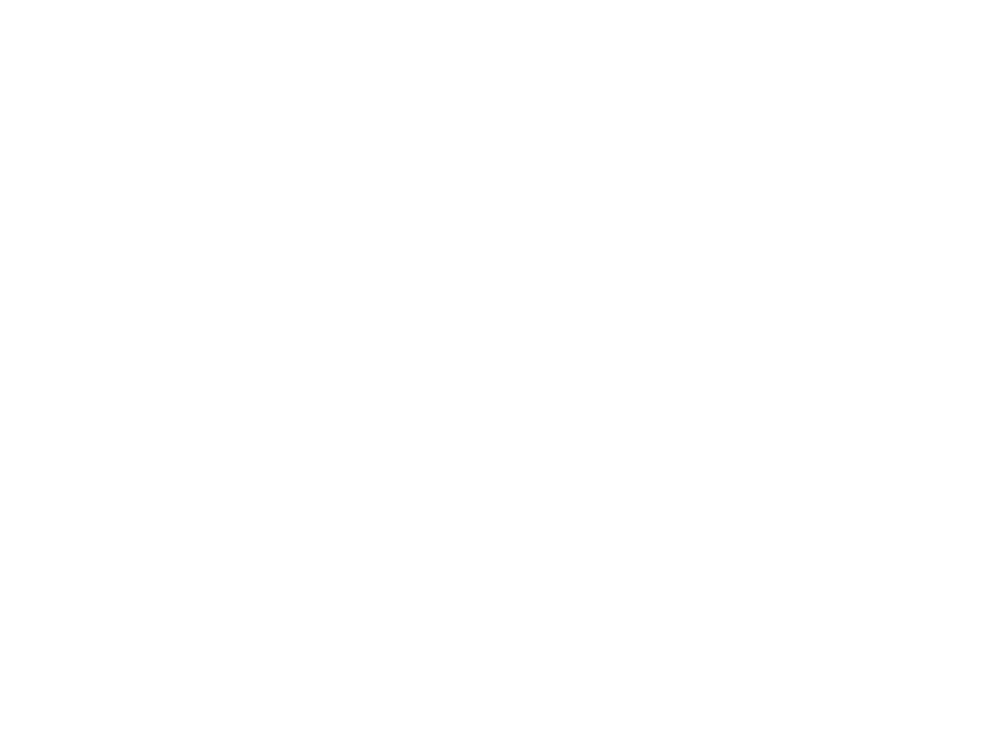

In [34]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np

# ヒストグラムを作成（ラベル0は青、ラベル1は赤）
plt.hist([number_data[correct_nucorrect == 0], number_data[correct_nucorrect == 1], number_data[correct_nucorrect == 2]], bins=40, edgecolor='black', alpha=0.5, color=['blue', 'red', 'green'], label=['correct', 'uncorrect', 'unanswerable'])

# グラフにタイトルや軸ラベルを追加
plt.title('Histogram of 1000 Data Points with Labels')
plt.xlabel('Number of data in area')
plt.ylabel('Frequency')

# 凡例を表示
plt.legend()

# ヒストグラムを表示
plt.show()


In [65]:
conditions=number_data <100
number_data[conditions]
conditions
conditions_data = np.where(conditions)[0]

false_indices = [12, 23, 25, 40, 42, 43, 49, 51, 66, 68, 74, 89, 98, 135, 141, 147, 153, 155, 166, 222, 239, 241, 244, 248, 316, 325, 332, 337, 344, 359, 361, 363, 381, 382, 396, 404, 413, 441, 444, 452, 454, 457, 460, 525, 565, 569, 581, 628, 639, 669, 670, 681, 684, 688, 699, 711, 715, 732, 760, 787, 859, 878, 911, 918, 922, 934, 937, 942, 947, 981]

set1 = set(conditions_data)
set2 = set(false_indices)

common_elements = list(set1.intersection(set2))

def find_difference(list1, list2):
    set1 = set(list1)
    set2 = set(list2)

    difference = set1.symmetric_difference(set2)

    return list(difference)

true_conditions_indices = find_difference(conditions_data, common_elements)
true_conditions_indices

common_elements
y_test_np[12]

7

In [36]:
# import numpy as np
# import mpl_toolkits.mplot3d
# import matplotlib.pyplot as plt

# select=2

# # rcParams['figure.figsize'] = 10, 10

# x = np.linspace(-0.2, 0.2, 100)
# y = np.linspace(-0.2, 0.2, 100)
# X, Y = np.meshgrid(x, y)
# Z1 = np.ones_like(X)
# Z2 = -1 * np.ones_like(X)


# fig=plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(z_test_np[true_indices[select], 0], z_test_np[true_indices[select], 1], z_test_np[true_indices[select], 2], s=300, marker="*", edgecolors="white")
# x_prime=z_test_np[true_indices[select], 0]
# y_prime=z_test_np[true_indices[select], 1]
# z_prime=z_test_np[true_indices[select], 2]
# ax.plot_surface(X+x_prime, Y+y_prime, Z1+z_prime-0.8, alpha=0.4)
# ax.plot_surface(X+x_prime, Y+y_prime, Z2+z_prime+0.8, alpha=0.4)
# ax.plot_surface(X+x_prime, 0.2+y_prime, Y+z_prime, alpha=0.4)
# ax.plot_surface(X+x_prime, -0.2+y_prime, Y+z_prime, alpha=0.4)
# ax.plot_surface(0.2+x_prime, X+y_prime, Y+z_prime, alpha=0.4)
# ax.plot_surface(-0.2+x_prime, X+y_prime, Y+z_prime, alpha=0.4)

# for i in range(class_num):    ax.scatter(z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2], color=colors[i], label=class_names[i], alpha=0.06)


# ax.set_xlim(-2, 2)
# ax.set_ylim(-2, 2)
# ax.set_zlim(-2, 2)

# plt.show()

# # クラス名
# class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
# # クラス数
# class_num=len(class_names)
# # 事前に定義された10色のリスト
# colors = ["blue","green","red","cyan","magenta","yellow","black",'purple','#a65628','#ff7f00']

# print(y_test_np[true_indices[select]])
# print(class_names[y_test_np[true_indices[select]]])
# print(colors[y_test_np[true_indices[select]]])

<IPython.core.display.Javascript object>


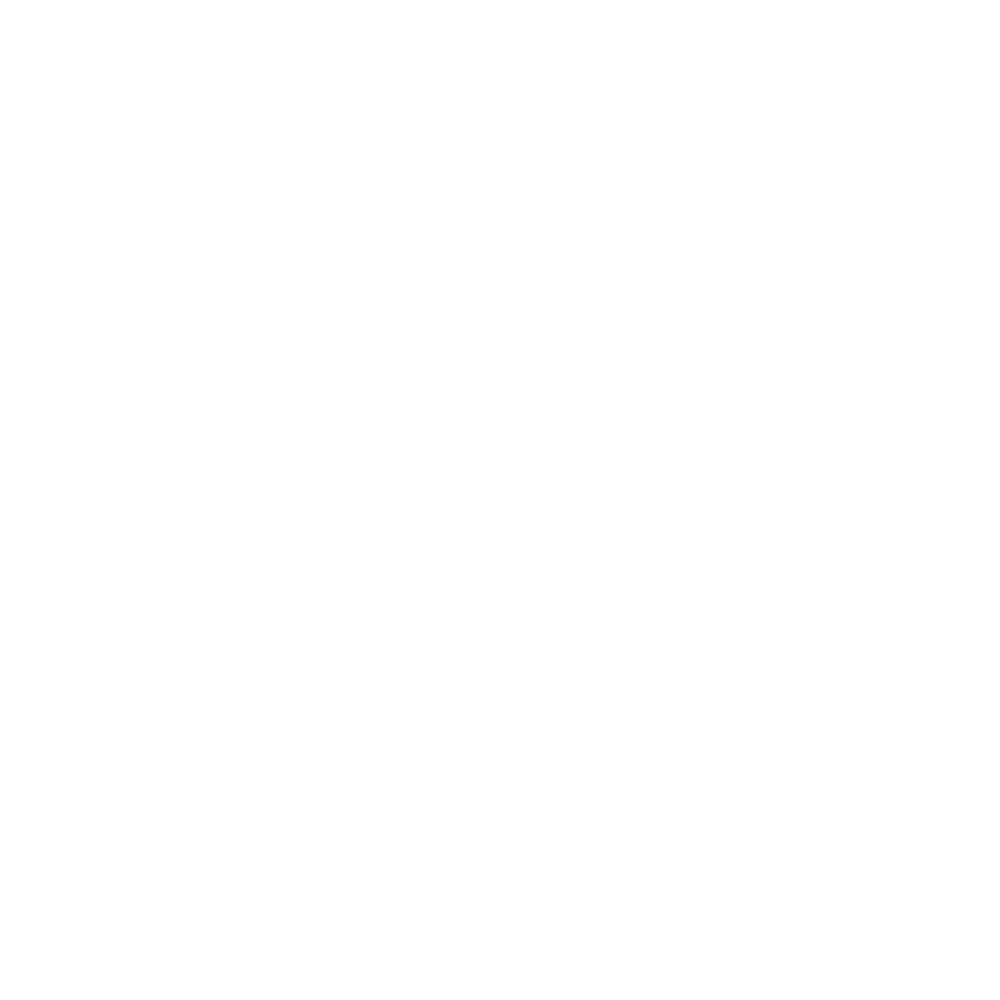

0
T-shirt/top
blue


In [37]:
import numpy as np
import mpl_toolkits.mplot3d
import matplotlib.pyplot as plt

select=2

# rcParams['figure.figsize'] = 10, 10

x = np.linspace(-0.2, 0.2, 100)
y = np.linspace(-0.2, 0.2, 100)
X, Y = np.meshgrid(x, y)
Z1 = np.ones_like(X)
Z2 = -1 * np.ones_like(X)


fig=plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(z_test_np[common_elements[select], 0], z_test_np[common_elements[select], 1], z_test_np[common_elements[select], 2], s=300, marker="*", edgecolors=colors[y_test_np[common_elements[select]]])
x_prime=z_test_np[common_elements[select], 0]
y_prime=z_test_np[common_elements[select], 1]
z_prime=z_test_np[common_elements[select], 2]
ax.plot_surface(X+x_prime, Y+y_prime, Z1+z_prime-0.8, alpha=0.4)
ax.plot_surface(X+x_prime, Y+y_prime, Z2+z_prime+0.8, alpha=0.4)
ax.plot_surface(X+x_prime, 0.2+y_prime, Y+z_prime, alpha=0.4)
ax.plot_surface(X+x_prime, -0.2+y_prime, Y+z_prime, alpha=0.4)
ax.plot_surface(0.2+x_prime, X+y_prime, Y+z_prime, alpha=0.4)
ax.plot_surface(-0.2+x_prime, X+y_prime, Y+z_prime, alpha=0.4)

for i in range(class_num):    ax.scatter(z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2], color=colors[i], label=class_names[i], alpha=0.06)


ax.set_xlim(-2, 2)
ax.set_ylim(-2, 2)
ax.set_zlim(-2, 2)

plt.show()

# クラス名
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
# クラス数
class_num=len(class_names)
# 事前に定義された10色のリスト
colors = ["blue","green","red","cyan","magenta","yellow","black",'purple','#a65628','#ff7f00']

print(y_test_np[common_elements[select]])
print(class_names[y_test_np[common_elements[select]]])
print(colors[y_test_np[common_elements[select]]])

In [90]:
data=[]
# level0がより左側のインデックスで、階層は上のインデックス
test_radius=[0.6]
string_test_radius = [str(radius) for radius in test_radius for _ in range(3)]
# print(string_test_radius)
# level0
level0=string_test_radius
# 予測ラベル格納
# predictions=np.zeros((z_test_np.shape[0],))
z_test_np
# 複製の作成
sub_y_test=y_test_np.copy()
# 割合パラメータ（50, 60, 70, 80, 90, 95）
para=60
# 四角形を作ってから、球状判定領域を作成
array=np.array(z_valid_np.shape)
percentage=np.empty(10)

label_ans = ["正解", "不正解", "解答不可"]
# test_radiusの値の数に応じてパターンを増やす
level1 = [label_ans[j] for i in range(len(test_radius)) for j in range(len(label_ans))]
indices = [level0, level1]
# print(indices)
abc=[]
# データの整理

# 
sample_data = [np.empty((10000, 3)) for _ in range(len(false_indices))]
# sample_data=array2
# sample_data_prime=array2-z_test_np[0]
# print(sample_data_prime.shape)
# sample_label=array3
sample_label=[np.empty((10000)) for _ in range(len(false_indices))]
sample_data

for index in range(1):
    for index2, l in enumerate(common_elements):
        # 四角形内か否かを判定
        array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
        array1=array.all(axis=1)
        array2=z_valid_np[array1] 
        # 1103
        sample_data[index2]=array2
        total_elements=array2.shape[0]
        # 1114の条件付け加え
        if total_elements > 1000:
            abc.append(l)
        # labelの確認
        array3=y_valid_np[array1]
        # 1103
        sample_label[index2]=array3
    #     print(type(array3))
        counts=np.bincount(array3, minlength=10)
        # 結果の表示
        for i in range(10):
            percentage[i] = (counts[i] / total_elements) * 100
            print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
        print("--------------------------------------------------------------------")
        # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
        #     条件分岐
        max_value = np.max(percentage)
        print(f"max_value:{max_value}")
        max_index = np.argmax(percentage)
        print(f"max_index:{max_index}")
        print(f"解答は{y_test_np[l]}となる")
        print(f"インデックスは{l}")


クラス 0 は 7 回出現しました。割合は 0.48% です。
クラス 1 は 1 回出現しました。割合は 0.07% です。
クラス 2 は 57 回出現しました。割合は 3.88% です。
クラス 3 は 18 回出現しました。割合は 1.22% です。
クラス 4 は 534 回出現しました。割合は 36.33% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 853 回出現しました。割合は 58.03% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:58.02721088435374
max_index:6
解答は4となる
インデックスは396
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 1498 回出現しました。割合は 96.58% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 45 回出現しました。割合は 2.90% です。
クラス 8 は 2 回出現しました。割合は 0.13% です。
クラス 9 は 6 回出現しました。割合は 0.39% です。
--------------------------------------------------------------------
max_value:96.58284977433914
max_index:5
解答は7となる
インデックスは12
クラス 0 は 305 回出現しました。割合は 8.98% です。
クラス 1 は 3 回出現しました。割合は 0.09% です。
クラス 2 は 21 回出現しました。割合は 0.6

In [146]:
# 可視化

select=2

# rcParams['figure.figsize'] = 10, 10

test_radius=[0.45]

test_ra=test_radius[0]

# x = np.linspace(-test_ra, test_ra, 100)
# y = np.linspace(-test_ra, test_ra, 100)
# X, Y = np.meshgrid(x, y)
# Z1 = np.ones_like(X)
# Z2 = -1 * np.ones_like(X)


# fig=plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(z_test_np[common_elements[select], 0], z_test_np[common_elements[select], 1], z_test_np[common_elements[select], 2], s=300, marker="*", edgecolors=colors[y_test_np[common_elements[select]]])
# x_prime=z_test_np[common_elements[select], 0]
# y_prime=z_test_np[common_elements[select], 1]
# z_prime=z_test_np[common_elements[select], 2]
# ax.plot_surface(X+x_prime, Y+y_prime, Z1+z_prime-1+test_ra, alpha=0.4)
# ax.plot_surface(X+x_prime, Y+y_prime, Z2+z_prime+1-test_ra, alpha=0.4)
# ax.plot_surface(X+x_prime, test_ra+y_prime, Y+z_prime, alpha=0.4)
# ax.plot_surface(X+x_prime, -test_ra+y_prime, Y+z_prime, alpha=0.4)
# ax.plot_surface(test_ra+x_prime, X+y_prime, Y+z_prime, alpha=0.4)
# ax.plot_surface(-test_ra+x_prime, X+y_prime, Y+z_prime, alpha=0.4)

# for i in range(class_num):    ax.scatter(z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2], color=colors[i], label=class_names[i], alpha=0.06)


# ax.set_xlim(-2, 2)
# ax.set_ylim(-2, 2)
# ax.set_zlim(-2, 2)

# plt.show()

# クラス名
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
# クラス数
class_num=len(class_names)
# 事前に定義された10色のリスト
colors = ["blue","green","red","cyan","magenta","yellow","black",'purple','#a65628','#ff7f00']

print(y_test_np[common_elements[select]])
print(class_names[y_test_np[common_elements[select]]])
print(colors[y_test_np[common_elements[select]]])

print("--------------------------------------------------------------------")

# 割合の表示

sample_data = [np.empty((60000, 3))]
sample_label=[np.empty((60000))]
sample_data

# for l in range(common_elements[select]):
l=true_conditions_indices[select]
# 四角形内か否かを判定
array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
#     print(array.shape)
array1=array.all(axis=1)
array2=z_valid_np[array1] 
print(array2.shape)
# 1103
sample_data=array2
total_elements=array2.shape[0]
print(total_elements)
# # 1114の条件付け加え
# if total_elements > 1000:
#     abc.append(l)
# labelの確認
array3=y_valid_np[array1]
# 1103
sample_label=array3
print(array3.shape)
counts=np.bincount(array3, minlength=10)
# 結果の表示
for i in range(10):
    if total_elements==0:
        percentage[i] = (counts[i] / total_elements) * 100
        percentage[i]=0.0
        counts[i]=0
    else:
        percentage[i] = (counts[i] / total_elements) * 100
    print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
print("--------------------------------------------------------------------")
# percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
#     条件分岐
max_value = np.max(percentage)
print(f"max_value:{max_value}")
max_index = np.argmax(percentage)
print(f"max_index:{max_index}")
print(f"解答は{y_test_np[l]}となる")
print(f"インデックスは{l}")

#
# # 正方形の一辺の長さ
# side_length = 2*test_ra

# x = np.linspace(test_ra, test_ra, 100)
# y = np.linspace(test_ra, test_ra, 100)
# X, Y = np.meshgrid(x, y)

# # Z座標をすべて0に設定
# Z = np.zeros_like(X)

# fig = plt.figure()
# ax = fig.add_subplot(111)

# # 正方形をプロット
# ax.contourf(X, Y, Z, levels=[-test_ra*2, test_ra*2], colors=['none'])



# for i in range(sample_data.shape[0]):
#     data_x=sample_data[i, 0]-z_test_np[common_elements[select], 0]
#     data_y=sample_data[i, 1]-z_test_np[common_elements[select], 1]
#     data_z=sample_data[i, 2]-z_test_np[common_elements[select], 2]
#     ax.scatter(data_x, data_y, color=colors[sample_label[i]])

# ax.set_xlim(-side_length / 2, side_length / 2)
# ax.set_ylim(-side_length / 2, side_length / 2)
# ax.scatter(0, 0, marker="*")

# plt.gca().set_aspect('equal', adjustable='box')
# plt.show()

0
T-shirt/top
blue
--------------------------------------------------------------------
(750, 3)
750
(750,)
クラス 0 は 1 回出現しました。割合は 0.13% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 31 回出現しました。割合は 4.13% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 714 回出現しました。割合は 95.20% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 4 回出現しました。割合は 0.53% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:95.19999999999999
max_index:4
解答は4となる
インデックスは774


In [147]:
## 距離関数
def calculate_distances(data1, data2):
    # data1 の各行と data2 とのユークリッド距離を計算
    distances = np.linalg.norm(data1 - data2, axis=1)

    return distances

def calculate_distances_normal(data1, data2):
    # numpyのユークリッド距離関数を使用して距離を計算
    distance = np.linalg.norm(data1 - data2)
    return distance



sample_data[sample_label==6].shape
# 各クラスの中心格納用
sample_data_means=np.zeros((10, 3))
# 中心間距離格納用
test_dis=np.zeros((10,))

# 以下に各クラスごとのクラス中心を算出するプログラムを作成
for i in range(class_num):
    sample_data_means[i]=np.mean(sample_data[sample_label==i], axis=0)
    # nanを無限大に置き換える
    sample_data_means[i]= np.nan_to_num(sample_data_means[i], nan=np.inf)
    print(sample_data_means[i])
    # test dataとの距離を算出
    test_dis[i]=calculate_distances_normal(sample_data_means[i], z_test_np[common_elements[select]])
test_dis

[ 0.35527936  1.19271123 -2.50860333]
[inf inf inf]
[ 0.31138685  1.16107166 -2.19550037]
[inf inf inf]
[ 0.16021813  1.28005636 -2.03448915]
[inf inf inf]
[ 0.1486897   1.07576323 -2.0426383 ]
[inf inf inf]
[inf inf inf]
[inf inf inf]


array([2.69571611,        inf, 2.4493953 ,        inf, 2.34174554,
              inf, 2.21783149,        inf,        inf,        inf])

In [148]:
# z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2]
# 分散
variance=np.zeros((class_num,3))

sample_data[i, 0]

# print(z_valid_np[y_valid_np==0].shape)
for i in range(class_num):
    variance[i]=np.var(sample_data[sample_label==i], axis=0)
#     print(variance[i])
variance

array([[0.        , 0.        , 0.        ],
       [       nan,        nan,        nan],
       [0.04331265, 0.04385175, 0.05889274],
       [       nan,        nan,        nan],
       [0.01140918, 0.05092458, 0.01830688],
       [       nan,        nan,        nan],
       [0.00699737, 0.00276896, 0.00646409],
       [       nan,        nan,        nan],
       [       nan,        nan,        nan],
       [       nan,        nan,        nan]])

0
T-shirt/top
blue


<IPython.core.display.Javascript object>


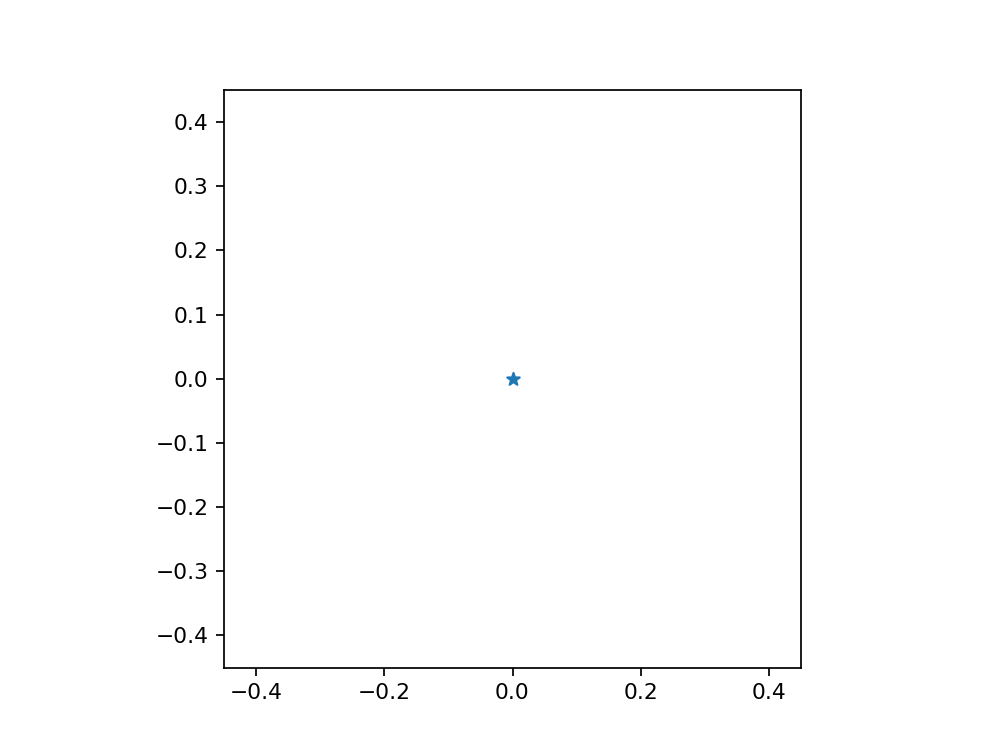

In [149]:
%matplotlib notebook

print(y_test_np[common_elements[select]])
print(class_names[y_test_np[common_elements[select]]])
print(colors[y_test_np[common_elements[select]]])


# 正方形の一辺の長さ
side_length = 2*test_ra

x = np.linspace(test_ra, test_ra, 100)
y = np.linspace(test_ra, test_ra, 100)
X, Y = np.meshgrid(x, y)

# Z座標をすべて0に設定
Z = np.zeros_like(X)

fig = plt.figure()
ax = fig.add_subplot(111)

# 正方形をプロット
ax.contourf(X, Y, Z, levels=[-test_ra*2, test_ra*2], colors=['none'])



for i in range(sample_data.shape[0]):
    data_x=sample_data[i, 0]-z_test_np[common_elements[select], 0]
    data_y=sample_data[i, 1]-z_test_np[common_elements[select], 1]
    data_z=sample_data[i, 2]-z_test_np[common_elements[select], 2]
    ax.scatter(data_x, data_y, color=colors[sample_label[i]])

for i in range(class_num):
    ax.scatter(sample_data_means[i][0]-z_test_np[common_elements[select], 0], sample_data_means[i][1]-z_test_np[common_elements[select], 1], color=colors[i], marker="*", s=300, edgecolors="white")

ax.set_xlim(-side_length / 2, side_length / 2)
ax.set_ylim(-side_length / 2, side_length / 2)
ax.scatter(0, 0, marker="*")

plt.gca().set_aspect('equal', adjustable='box')
plt.show()

<IPython.core.display.Javascript object>


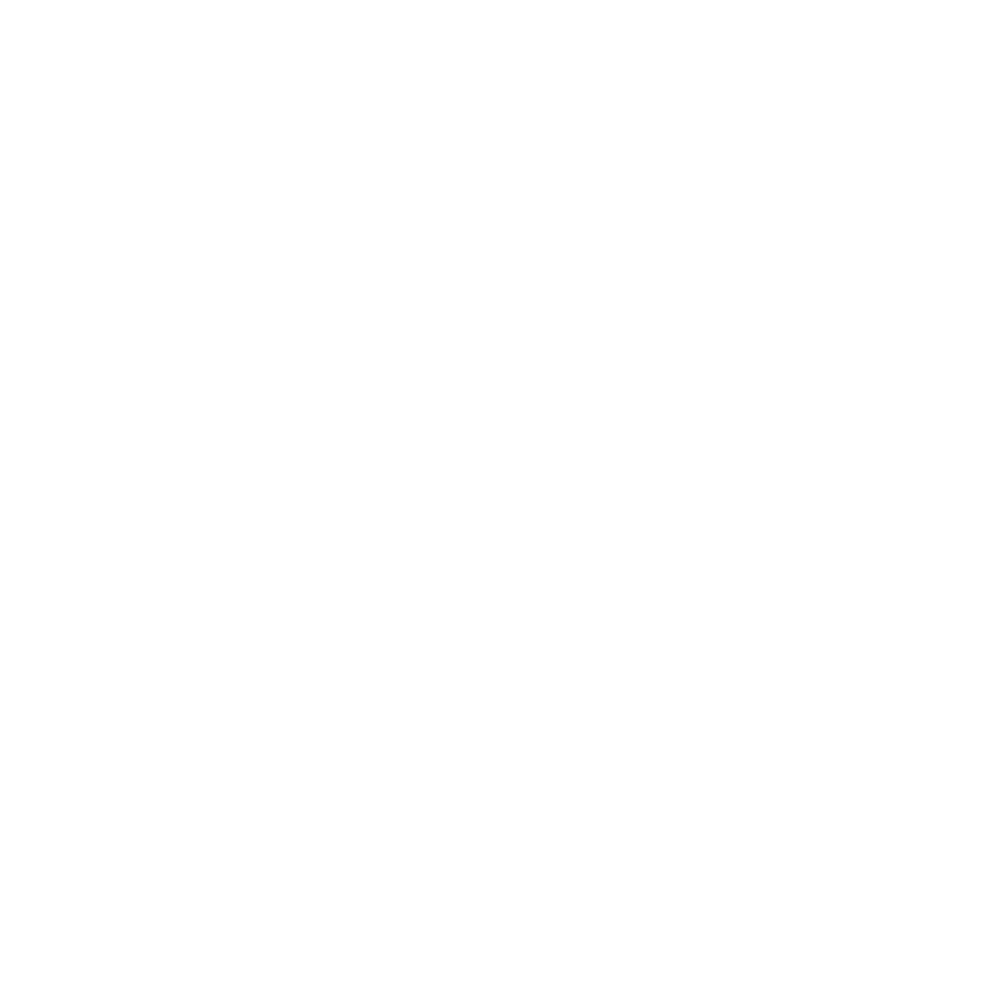

4
Coat
magenta
--------------------------------------------------------------------
total_elements 5543
クラス 0 は 6 回出現しました。割合は 0.11% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3613 回出現しました。割合は 65.18% です。
クラス 3 は 2 回出現しました。割合は 0.04% です。
クラス 4 は 1748 回出現しました。割合は 31.54% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 172 回出現しました。割合は 3.10% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 2 回出現しました。割合は 0.04% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:65.18130976005773
max_index:2
解答は4となる
インデックスは25


<IPython.core.display.Javascript object>


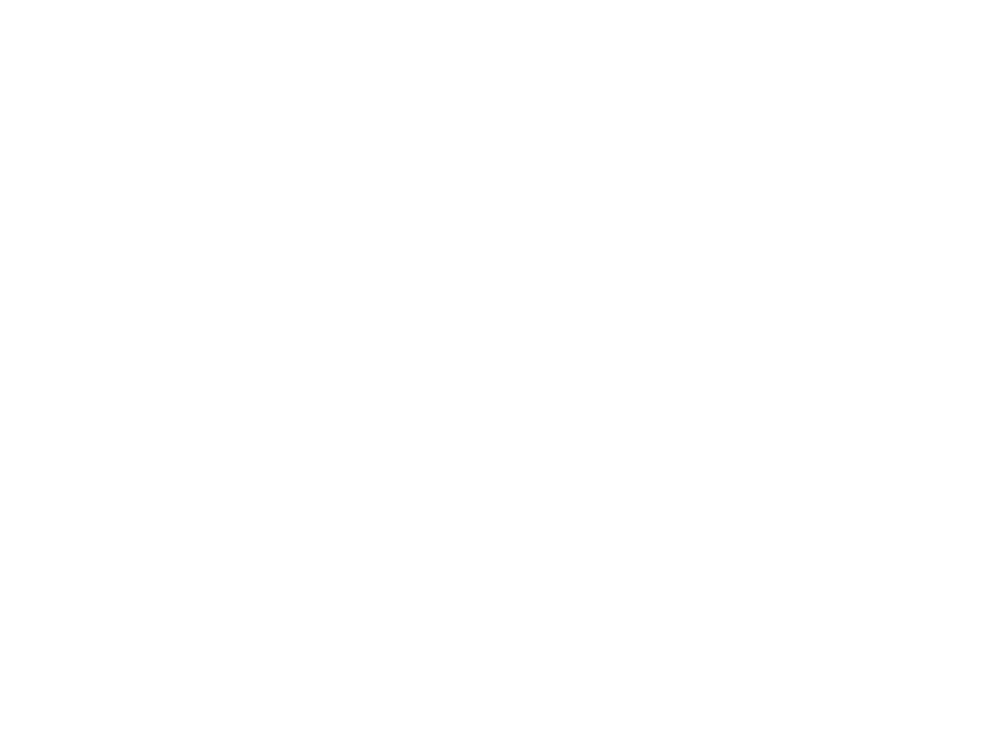

<IPython.core.display.Javascript object>


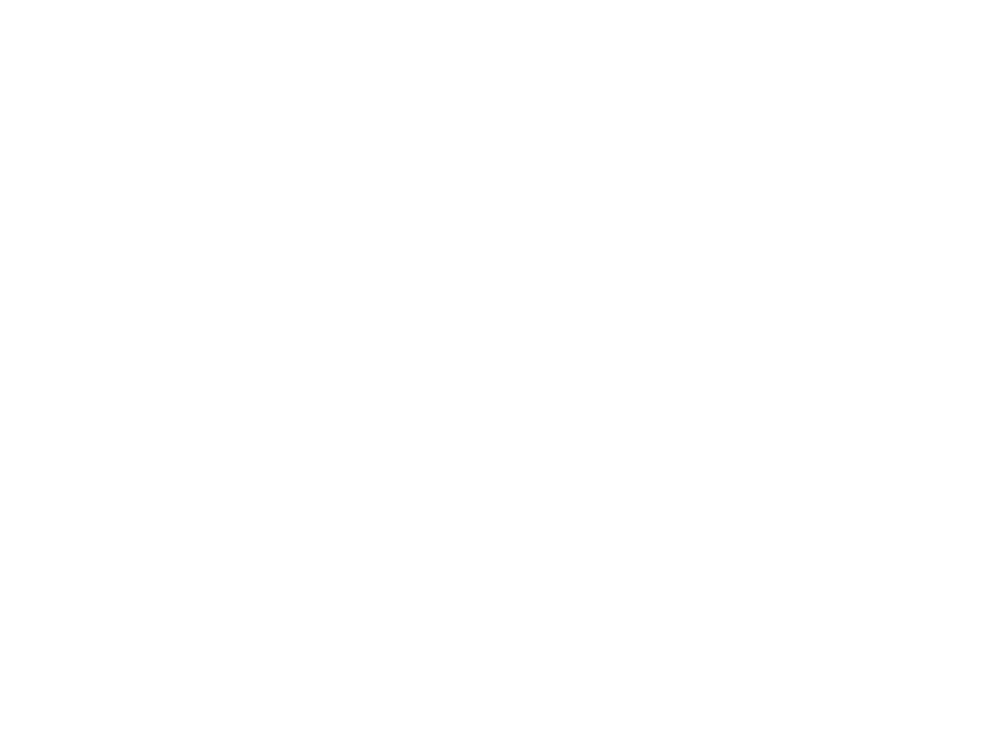

<IPython.core.display.Javascript object>


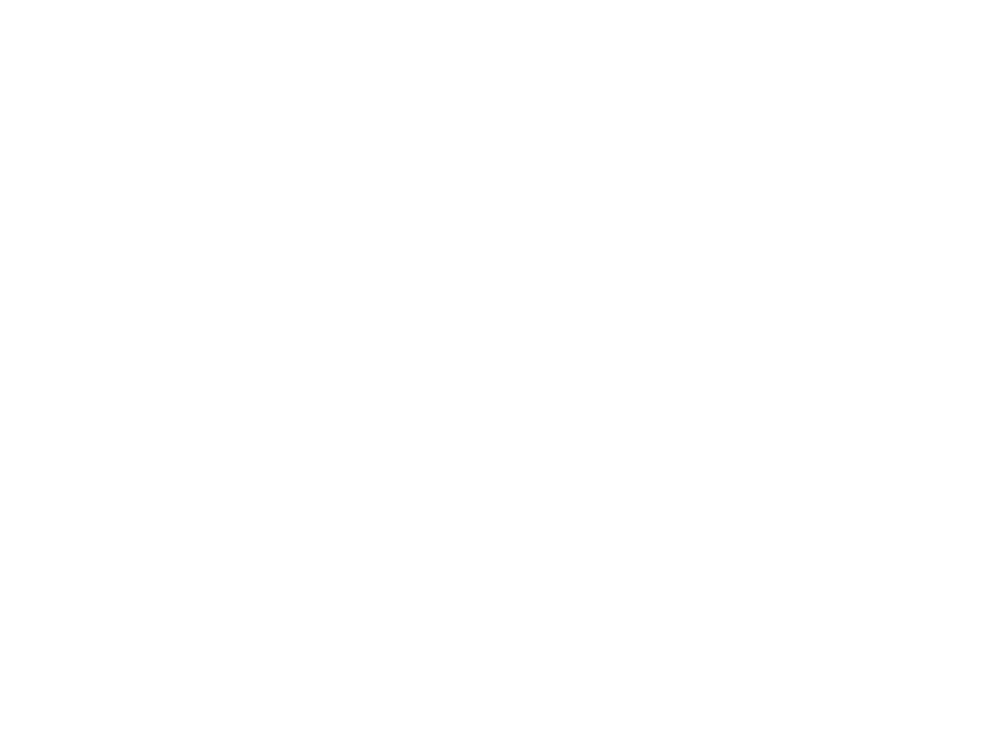

<IPython.core.display.Javascript object>


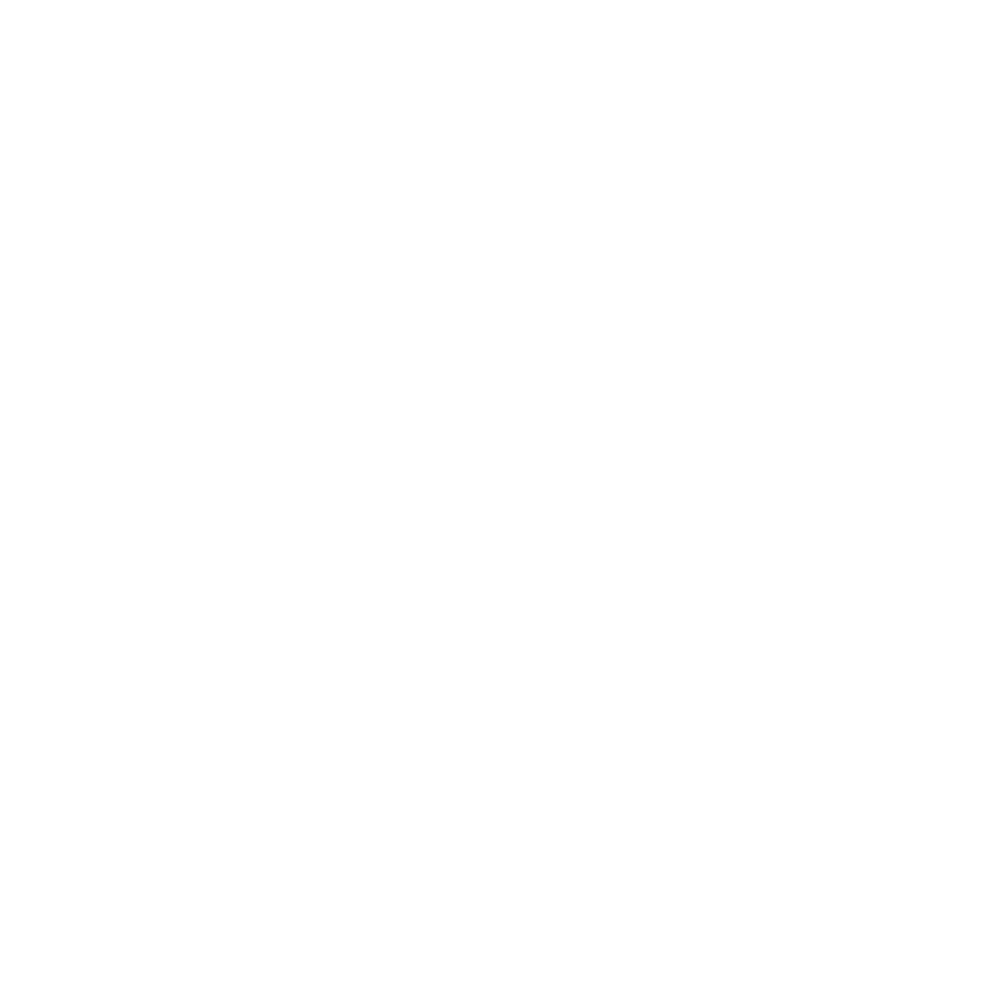

8
Bag
#a65628
--------------------------------------------------------------------
total_elements 121
クラス 0 は 69 回出現しました。割合は 57.02% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3 回出現しました。割合は 2.48% です。
クラス 3 は 3 回出現しました。割合は 2.48% です。
クラス 4 は 3 回出現しました。割合は 2.48% です。
クラス 5 は 3 回出現しました。割合は 2.48% です。
クラス 6 は 26 回出現しました。割合は 21.49% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 14 回出現しました。割合は 11.57% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:57.02479338842975
max_index:0
解答は8となる
インデックスは669


<IPython.core.display.Javascript object>


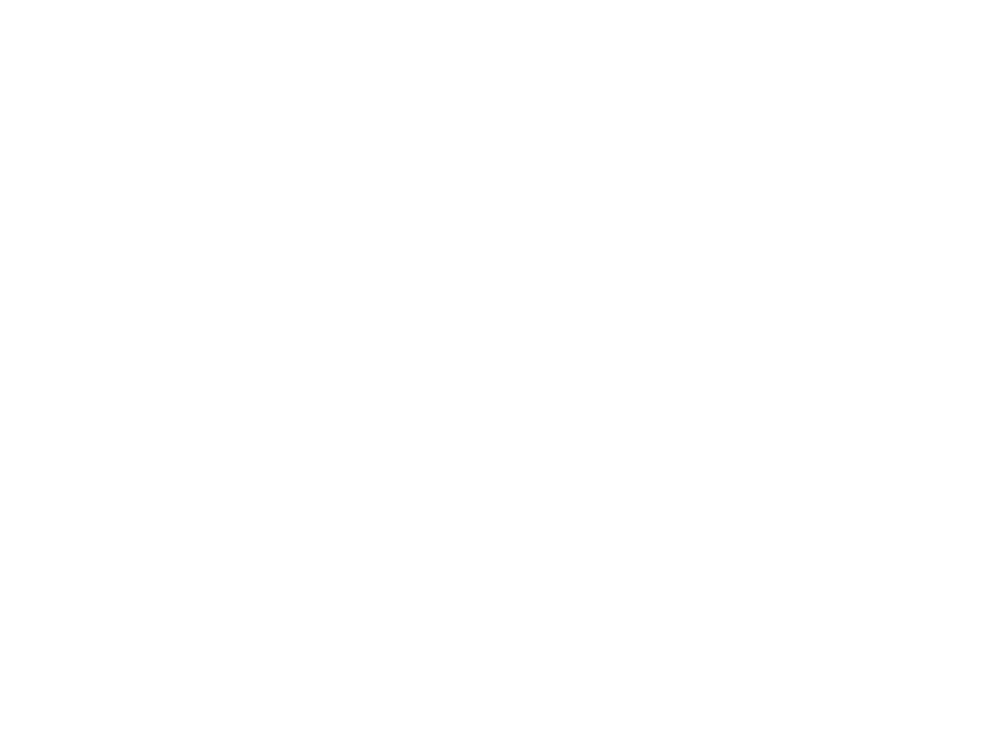

<IPython.core.display.Javascript object>


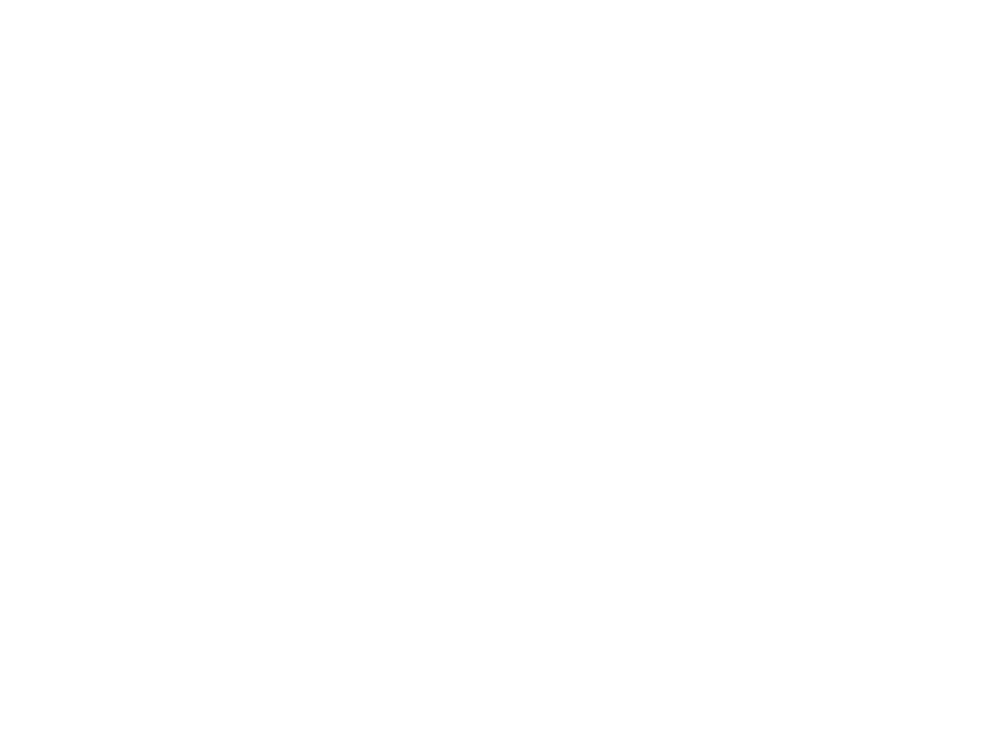

<IPython.core.display.Javascript object>


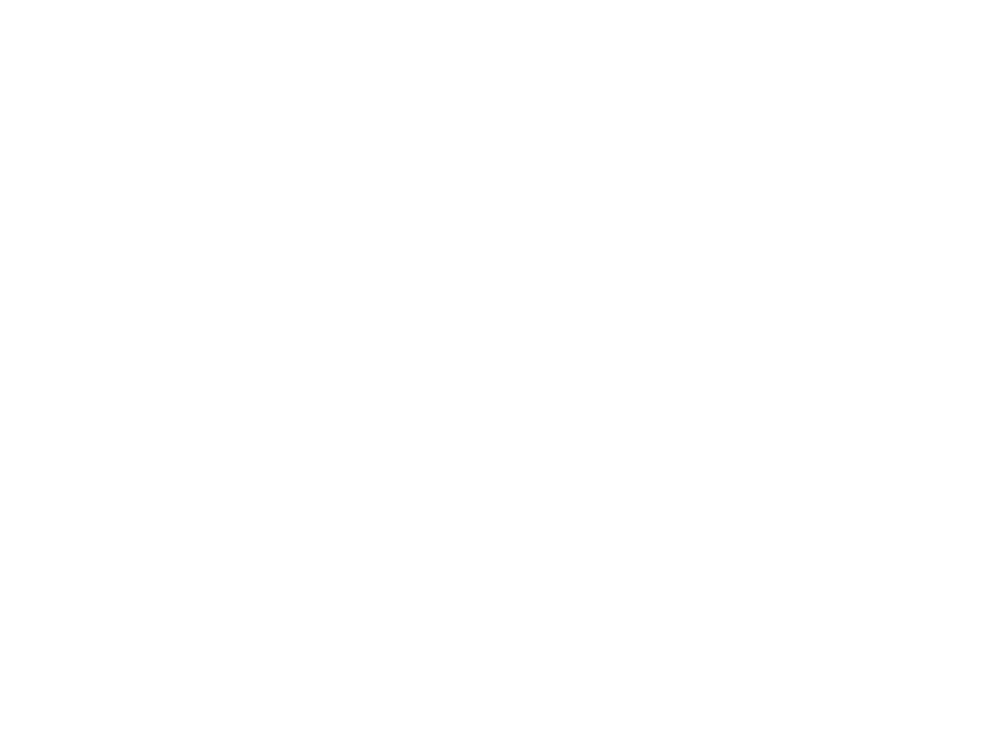

<IPython.core.display.Javascript object>


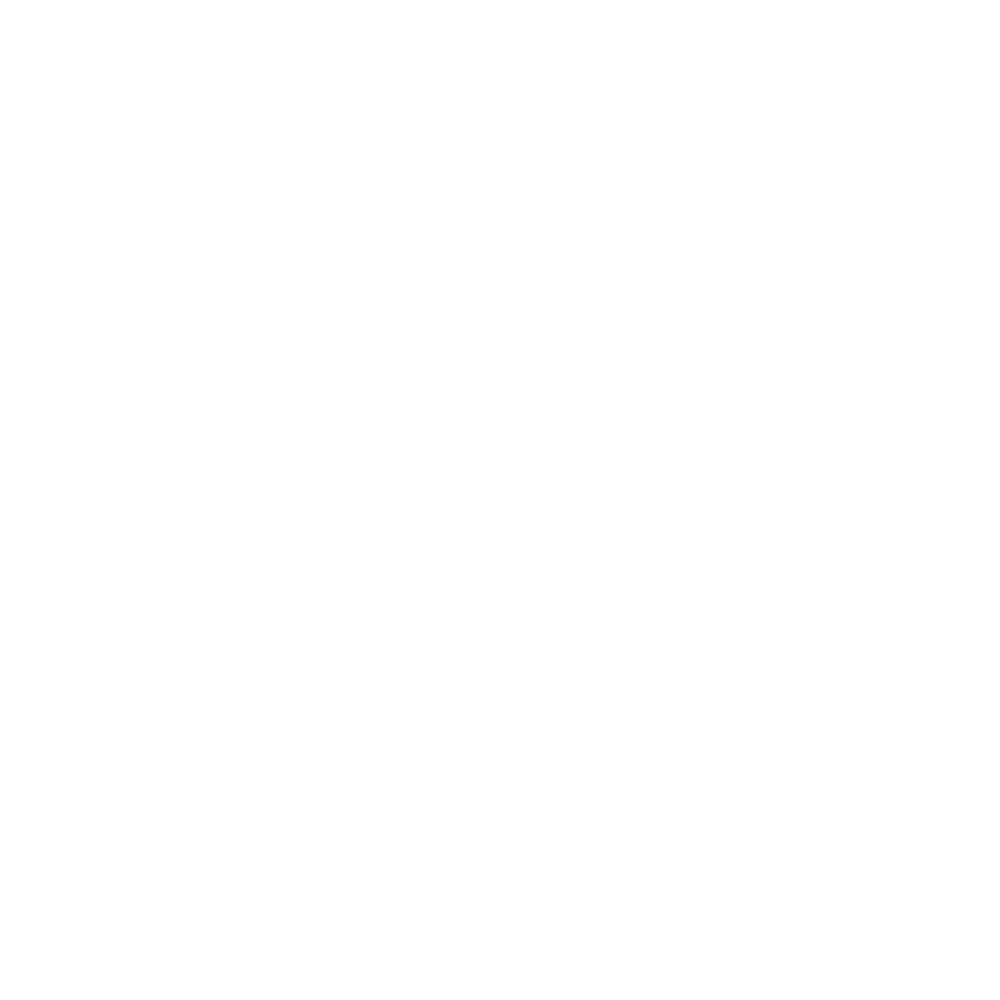

3
Dress
cyan
--------------------------------------------------------------------
total_elements 4807
クラス 0 は 204 回出現しました。割合は 4.24% です。
クラス 1 は 1 回出現しました。割合は 0.02% です。
クラス 2 は 153 回出現しました。割合は 3.18% です。
クラス 3 は 70 回出現しました。割合は 1.46% です。
クラス 4 は 231 回出現しました。割合は 4.81% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 4133 回出現しました。割合は 85.98% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 14 回出現しました。割合は 0.29% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:85.978780944456
max_index:6
解答は3となる
インデックスは934


<IPython.core.display.Javascript object>


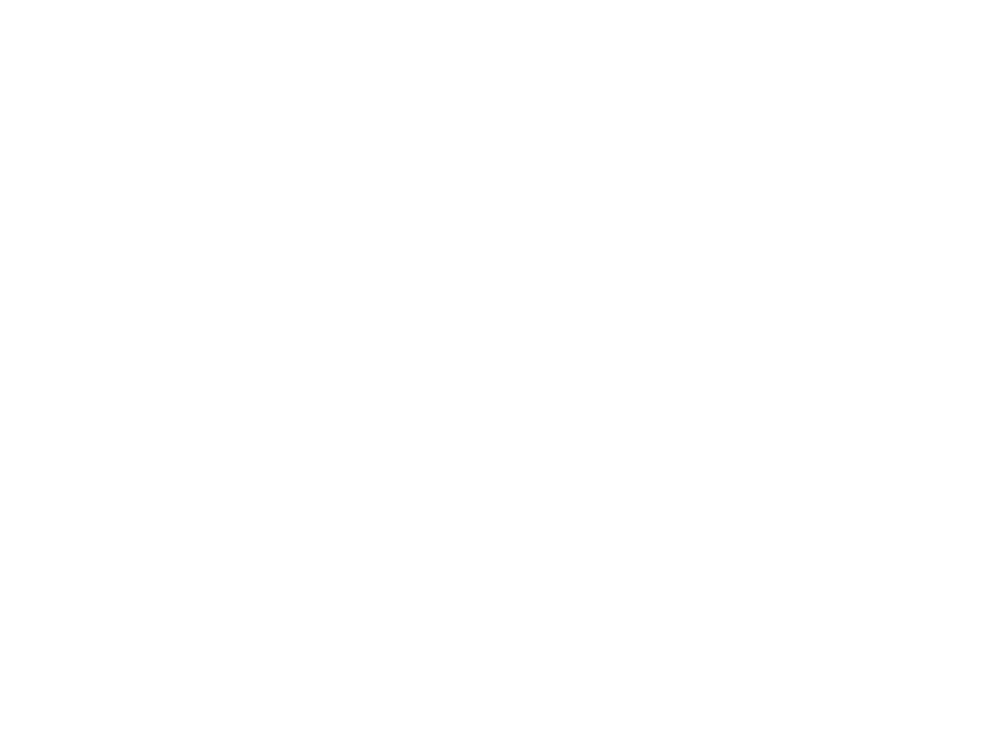

<IPython.core.display.Javascript object>


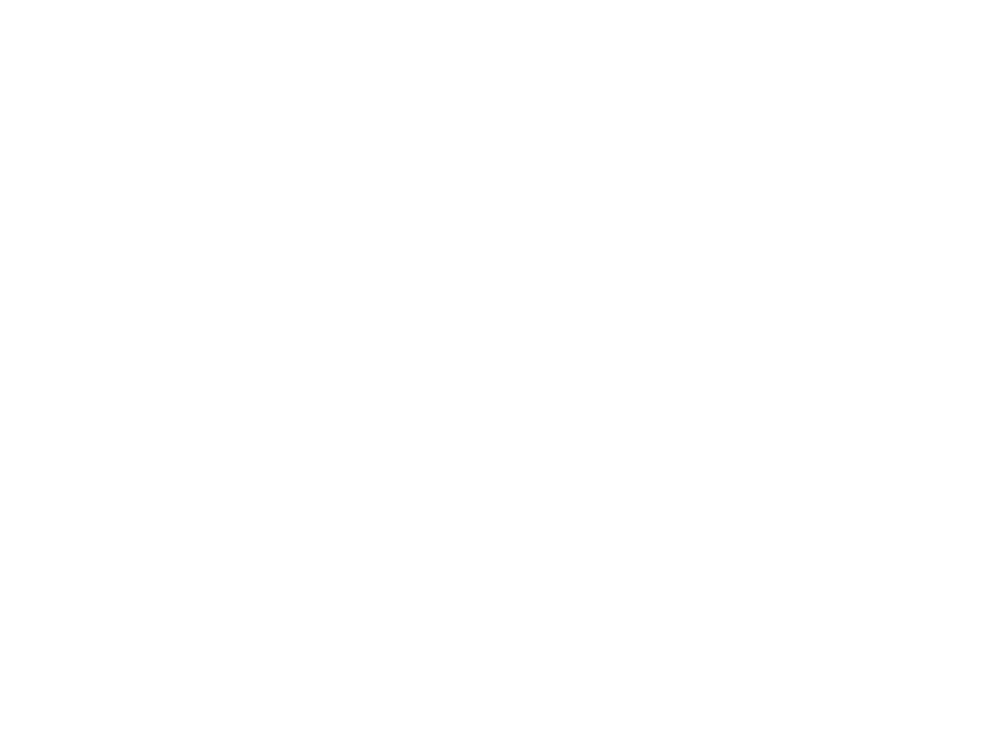

<IPython.core.display.Javascript object>


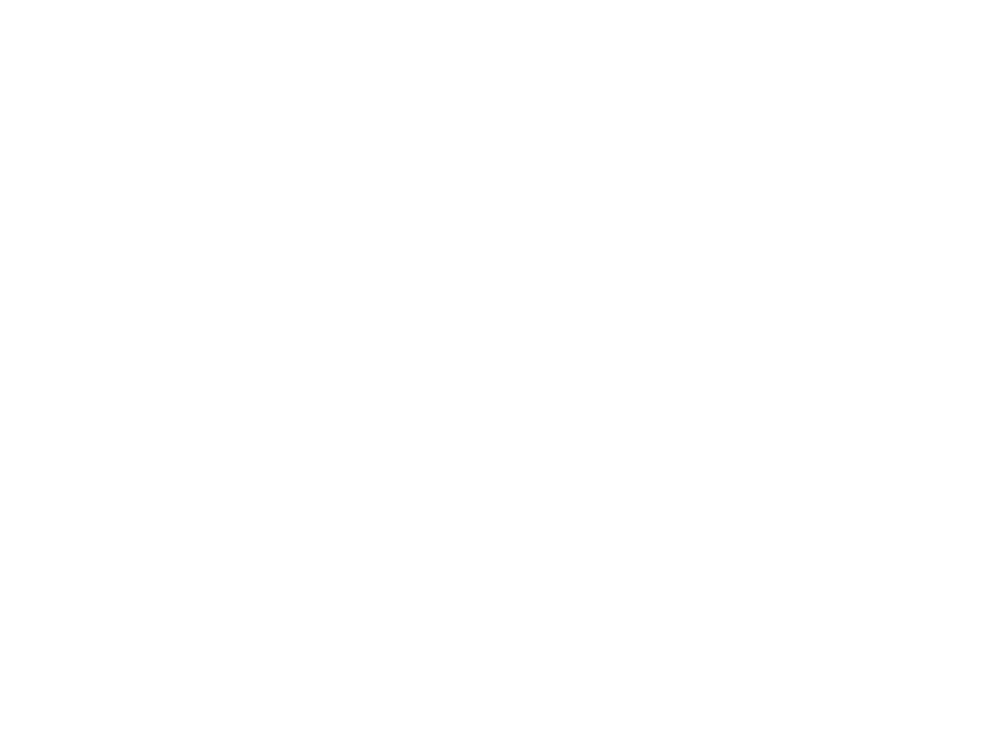

<IPython.core.display.Javascript object>


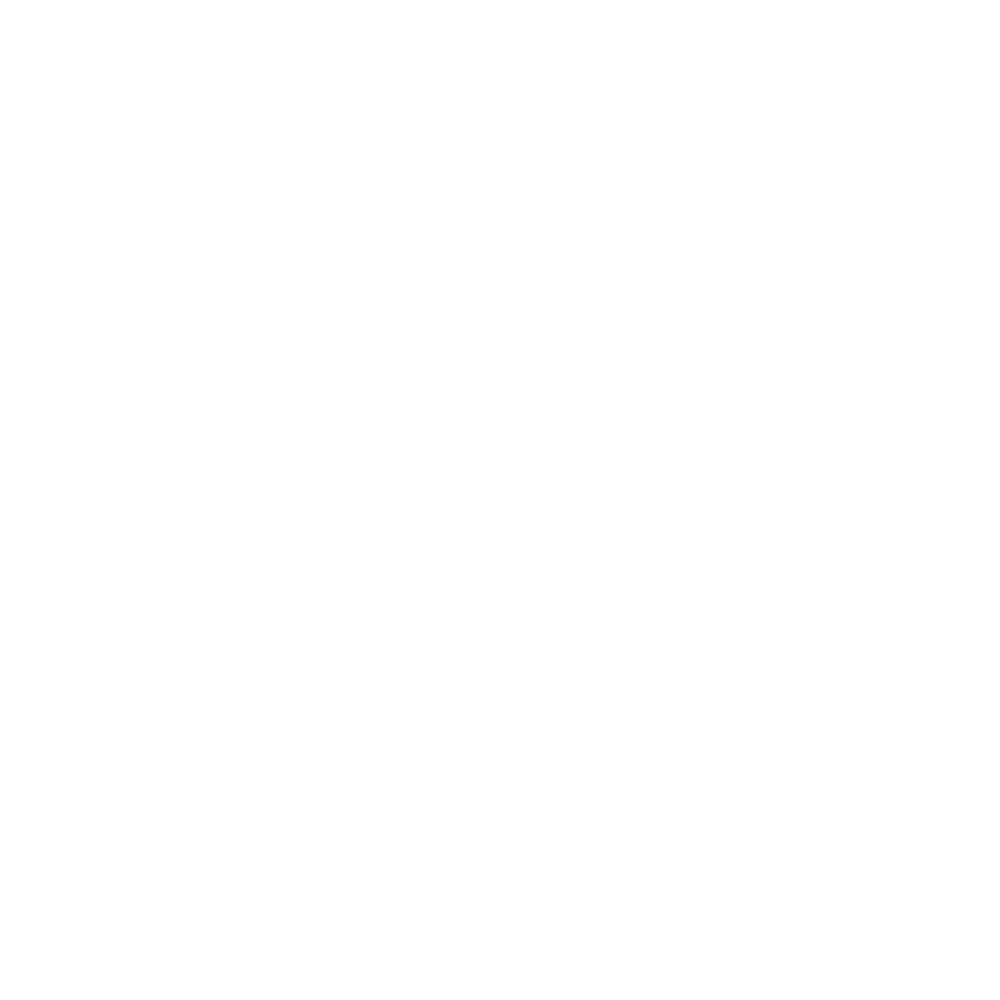

0
T-shirt/top
blue
--------------------------------------------------------------------
total_elements 4610
クラス 0 は 277 回出現しました。割合は 6.01% です。
クラス 1 は 1 回出現しました。割合は 0.02% です。
クラス 2 は 90 回出現しました。割合は 1.95% です。
クラス 3 は 76 回出現しました。割合は 1.65% です。
クラス 4 は 130 回出現しました。割合は 2.82% です。
クラス 5 は 1 回出現しました。割合は 0.02% です。
クラス 6 は 4018 回出現しました。割合は 87.16% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 17 回出現しました。割合は 0.37% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:87.15835140997831
max_index:6
解答は0となる
インデックスは681


<IPython.core.display.Javascript object>


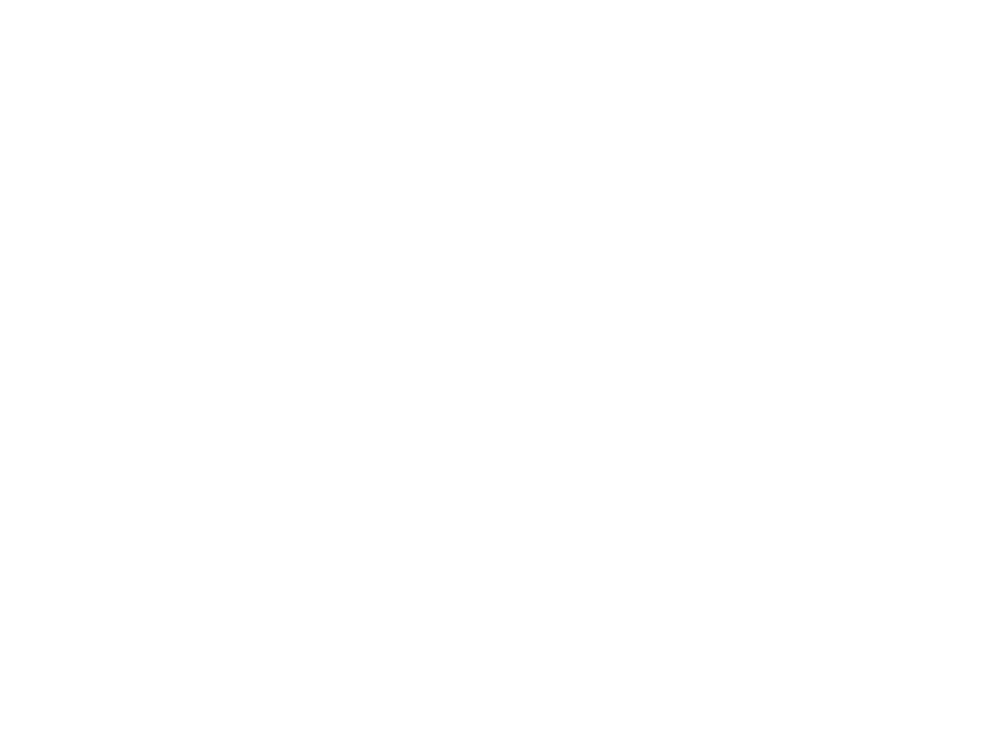

KeyboardInterrupt: 

In [40]:
# 可視化
for select in range(8, 15):
# select=1

    # rcParams['figure.figsize'] = 10, 10

    test_radius=[0.8]

    test_ra=test_radius[0]

    x = np.linspace(-test_ra, test_ra, 100)
    y = np.linspace(-test_ra, test_ra, 100)
    X, Y = np.meshgrid(x, y)
    Z1 = np.ones_like(X)
    Z2 = -1 * np.ones_like(X)


    fig=plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(z_test_np[common_elements[select], 0], z_test_np[common_elements[select], 1], z_test_np[common_elements[select], 2], s=300, marker="*", edgecolors=colors[y_test_np[common_elements[select]]])
    x_prime=z_test_np[common_elements[select], 0]
    y_prime=z_test_np[common_elements[select], 1]
    z_prime=z_test_np[common_elements[select], 2]
    ax.plot_surface(X+x_prime, Y+y_prime, Z1+z_prime-1+test_ra, alpha=0.4)
    ax.plot_surface(X+x_prime, Y+y_prime, Z2+z_prime+1-test_ra, alpha=0.4)
    ax.plot_surface(X+x_prime, test_ra+y_prime, Y+z_prime, alpha=0.4)
    ax.plot_surface(X+x_prime, -test_ra+y_prime, Y+z_prime, alpha=0.4)
    ax.plot_surface(test_ra+x_prime, X+y_prime, Y+z_prime, alpha=0.4)
    ax.plot_surface(-test_ra+x_prime, X+y_prime, Y+z_prime, alpha=0.4)

    for i in range(class_num):    ax.scatter(z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2], color=colors[i], label=class_names[i], alpha=0.06)


    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_zlim(-2, 2)

    plt.show()

    # クラス名
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    # クラス数
    class_num=len(class_names)
    # 事前に定義された10色のリスト
    colors = ["blue","green","red","cyan","magenta","yellow","black",'purple','#a65628','#ff7f00']

    print(y_test_np[common_elements[select]])
    print(class_names[y_test_np[common_elements[select]]])
    print(colors[y_test_np[common_elements[select]]])

    print("--------------------------------------------------------------------")

    # 割合の表示

    sample_data = [np.empty((60000, 3))]

    sample_label=[np.empty((60000))]
    sample_data

    # for l in range(common_elements[select]):
    l=common_elements[select]
    # 四角形内か否かを判定
    array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
    array1=array.all(axis=1)
    array2=z_valid_np[array1] 
#     print(array2.shape)
    # 1103
    sample_data=array2
    total_elements=array2.shape[0]
    print("total_elements",total_elements)
    # # 1114の条件付け加え
    # if total_elements > 1000:
    #     abc.append(l)
    # labelの確認
    array3=y_valid_np[array1]
    # 1103
    sample_label=array3
#     print(array3.shape)
    counts=np.bincount(array3, minlength=10)
    # 結果の表示
    for i in range(10):
        if total_elements==0:
            percentage[i] = (counts[i] / total_elements) * 100
            percentage[i]=0.0
            counts[i]=0
        else:
            percentage[i] = (counts[i] / total_elements) * 100
        print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
    print("--------------------------------------------------------------------")
    # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
    #     条件分岐
    max_value = np.max(percentage)
    print(f"max_value:{max_value}")
    max_index = np.argmax(percentage)
    print(f"max_index:{max_index}")
    print(f"解答は{y_test_np[l]}となる")
    print(f"インデックスは{l}")

    #
    # 正方形の一辺の長さ
    side_length = 2*test_ra

    x = np.linspace(test_ra, test_ra, 100)
    y = np.linspace(test_ra, test_ra, 100)
    X, Y = np.meshgrid(x, y)

    # Z座標をすべて0に設定
    Z = np.zeros_like(X)

    fig = plt.figure()
    ax = fig.add_subplot(111)

    # 正方形をプロット
    ax.contourf(X, Y, Z, levels=[-test_ra*2, test_ra*2], colors=['none'])



    for i in range(sample_data.shape[0]):
        data_x=sample_data[i, 0]-z_test_np[common_elements[select], 0]
        data_y=sample_data[i, 1]-z_test_np[common_elements[select], 1]
        data_z=sample_data[i, 2]-z_test_np[common_elements[select], 2]
        ax.scatter(data_x, data_y, color=colors[sample_label[i]])

    ax.set_xlim(-side_length / 2, side_length / 2)
    ax.set_ylim(-side_length / 2, side_length / 2)
    ax.scatter(0, 0, marker="*")

    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()
    
    fig = plt.figure()
    ax = fig.add_subplot(111)

    # 正方形をプロット
    ax.contourf(X, Y, Z, levels=[-test_ra*2, test_ra*2], colors=['none'])



    for i in range(sample_data.shape[0]):
        data_x=sample_data[i, 0]-z_test_np[common_elements[select], 0]
        data_y=sample_data[i, 1]-z_test_np[common_elements[select], 1]
        data_z=sample_data[i, 2]-z_test_np[common_elements[select], 2]
        ax.scatter(data_x, data_z, color=colors[sample_label[i]])

    ax.set_xlim(-side_length / 2, side_length / 2)
    ax.set_ylim(-side_length / 2, side_length / 2)
    ax.scatter(0, 0, marker="*")

    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()
    
    fig = plt.figure()
    ax = fig.add_subplot(111)

    # 正方形をプロット
    ax.contourf(X, Y, Z, levels=[-test_ra*2, test_ra*2], colors=['none'])



    for i in range(sample_data.shape[0]):
        data_x=sample_data[i, 0]-z_test_np[common_elements[select], 0]
        data_y=sample_data[i, 1]-z_test_np[common_elements[select], 1]
        data_z=sample_data[i, 2]-z_test_np[common_elements[select], 2]
        ax.scatter(data_y, data_z, color=colors[sample_label[i]])

    ax.set_xlim(-side_length / 2, side_length / 2)
    ax.set_ylim(-side_length / 2, side_length / 2)
    ax.scatter(0, 0, marker="*")

    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

========

<IPython.core.display.Javascript object>


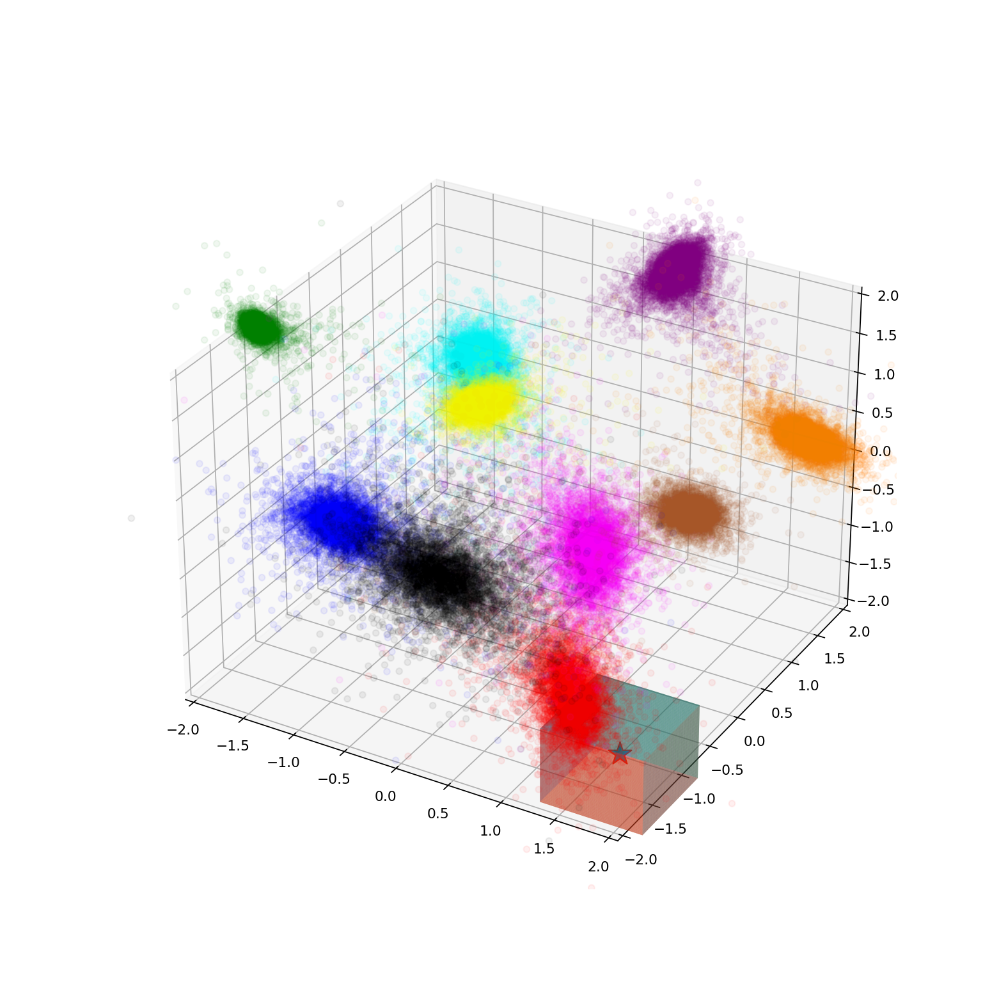

2
Pullover
red
--------------------------------------------------------------------
total_elements 1871
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 1853 回出現しました。割合は 99.04% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 11 回出現しました。割合は 0.59% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 7 回出現しました。割合は 0.37% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.03794762159272
max_index:2
解答は2となる
インデックスは1


<IPython.core.display.Javascript object>


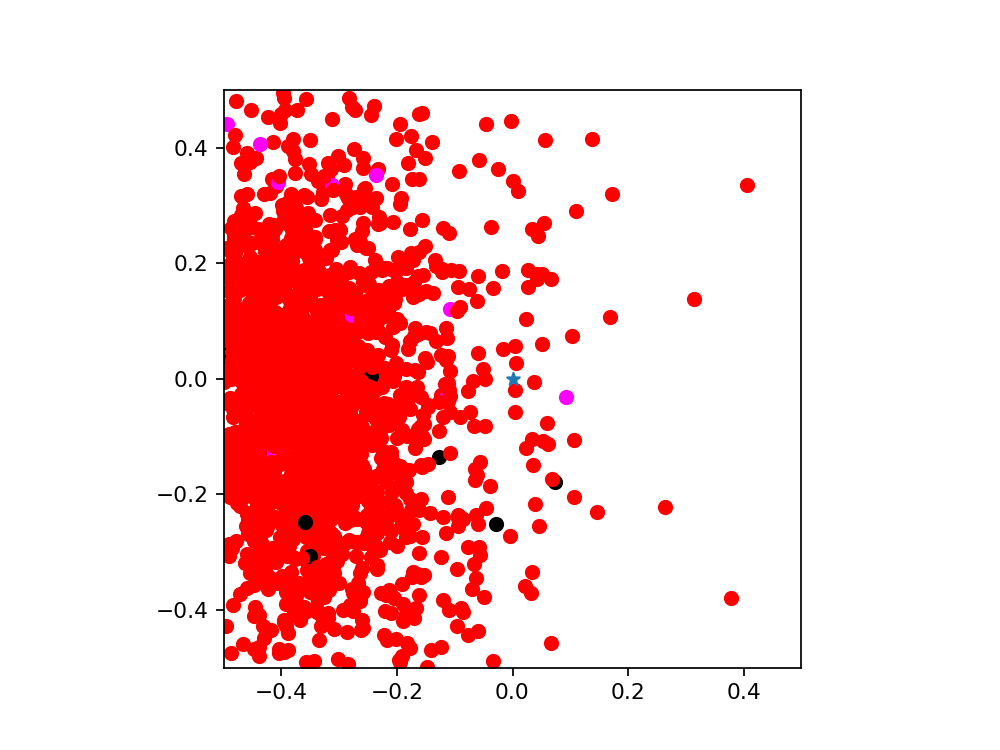

<IPython.core.display.Javascript object>


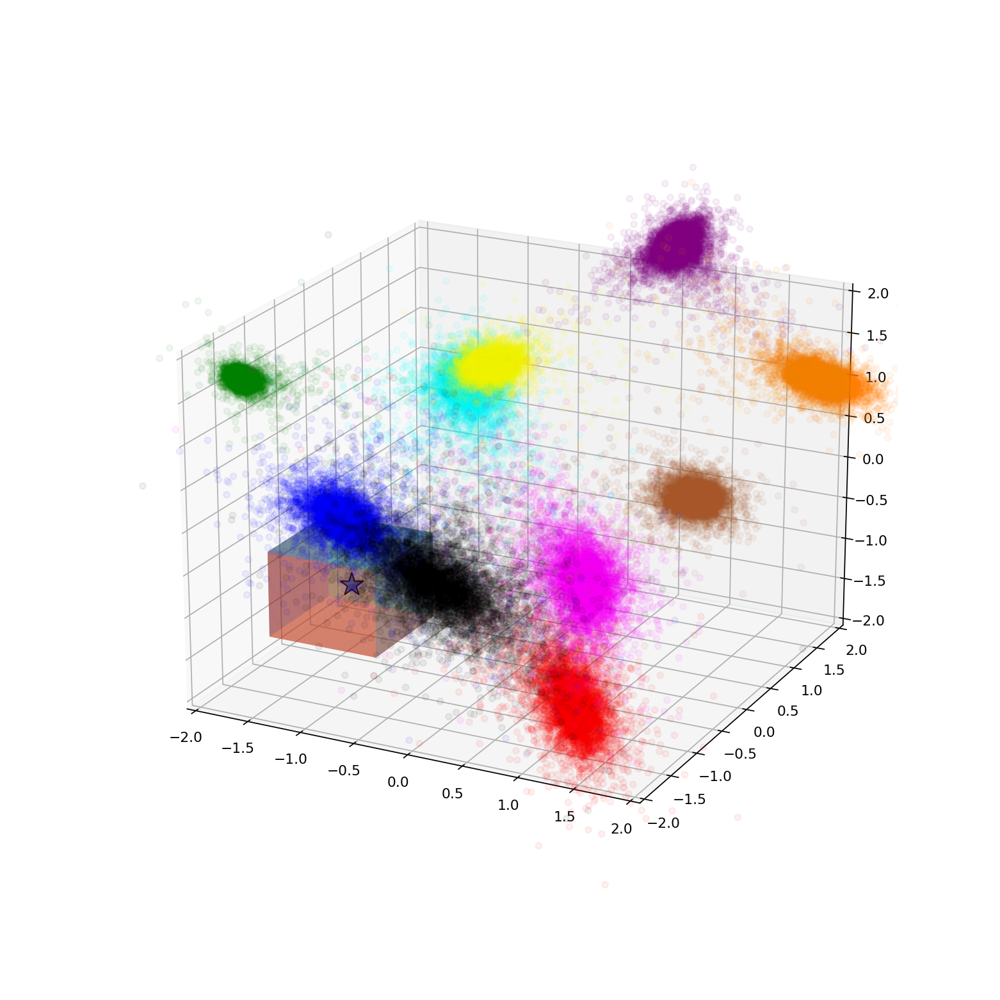

6
Shirt
black
--------------------------------------------------------------------
total_elements 1329
クラス 0 は 862 回出現しました。割合は 64.86% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 12 回出現しました。割合は 0.90% です。
クラス 3 は 3 回出現しました。割合は 0.23% です。
クラス 4 は 1 回出現しました。割合は 0.08% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 450 回出現しました。割合は 33.86% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 1 回出現しました。割合は 0.08% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:64.86079759217456
max_index:0
解答は6となる
インデックスは4


<IPython.core.display.Javascript object>


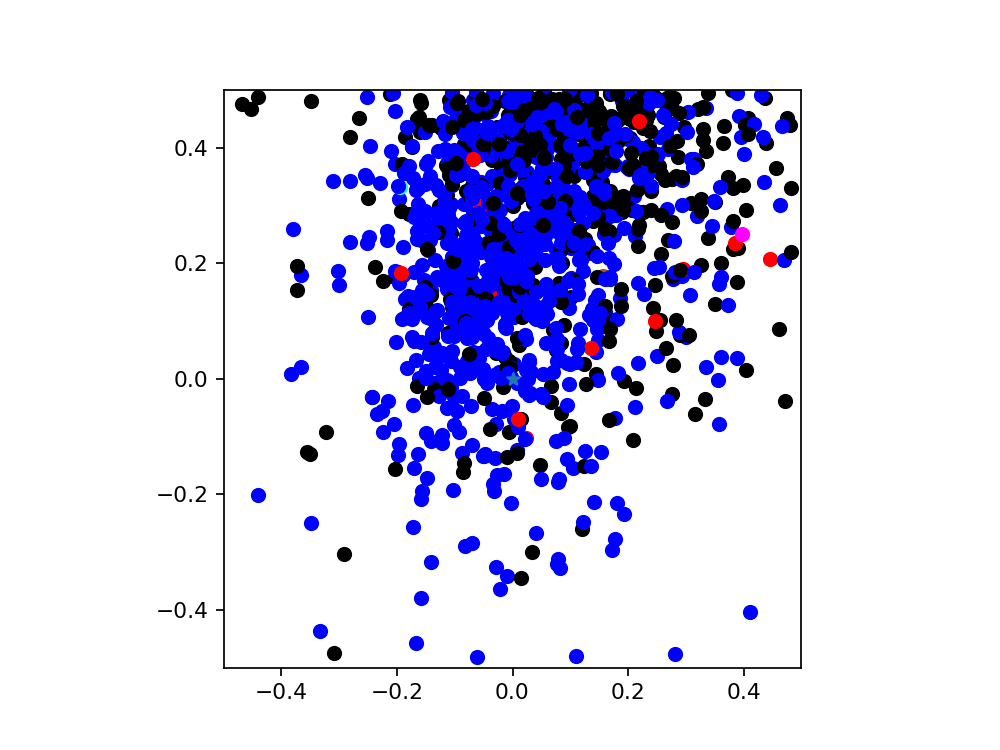

<IPython.core.display.Javascript object>


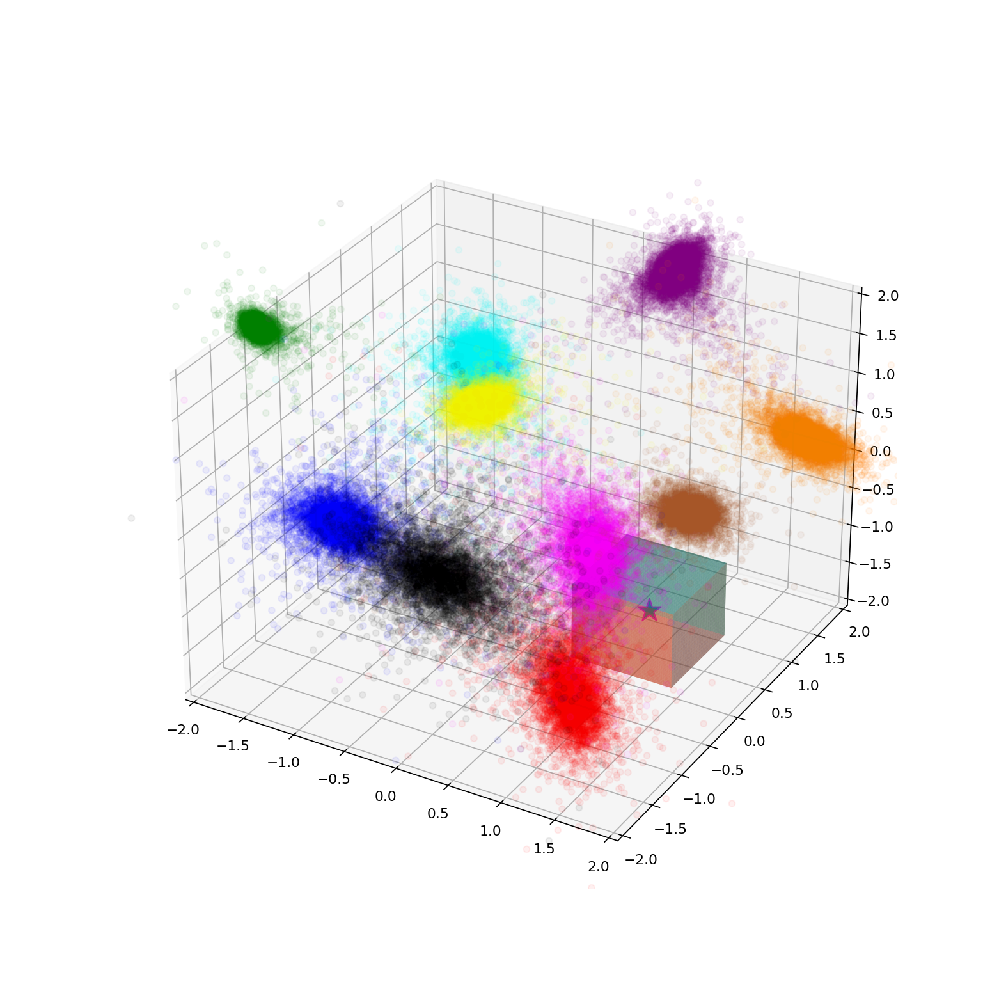

4
Coat
magenta
--------------------------------------------------------------------
total_elements 1188
クラス 0 は 1 回出現しました。割合は 0.08% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 49 回出現しました。割合は 4.12% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 1128 回出現しました。割合は 94.95% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 10 回出現しました。割合は 0.84% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:94.94949494949495
max_index:4
解答は4となる
インデックスは774


<IPython.core.display.Javascript object>


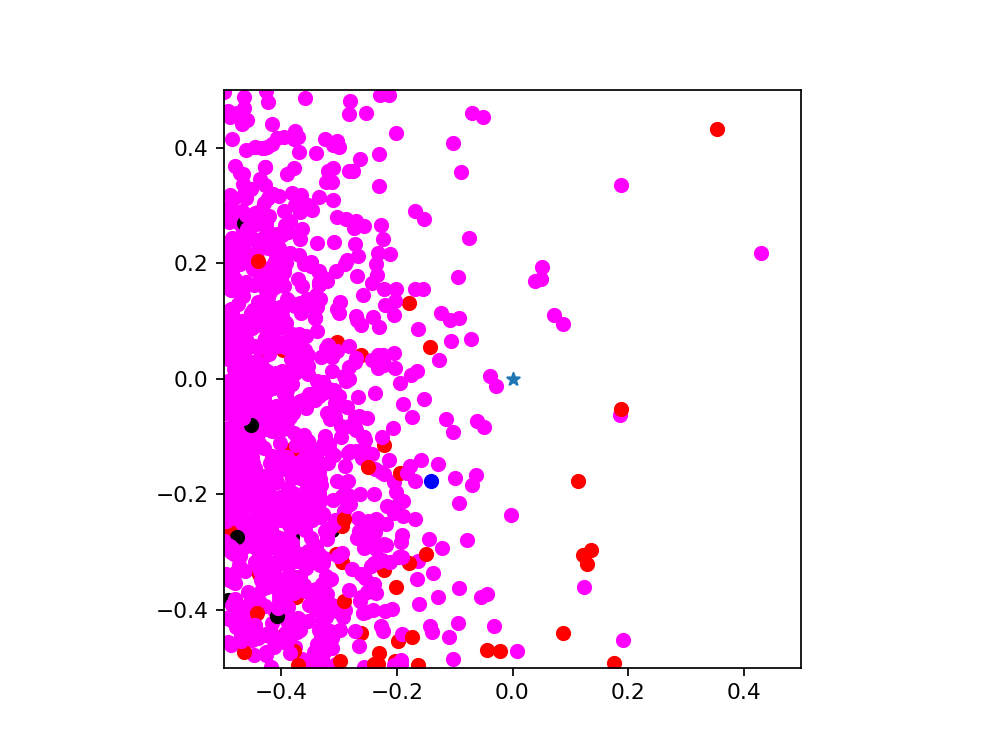

<IPython.core.display.Javascript object>


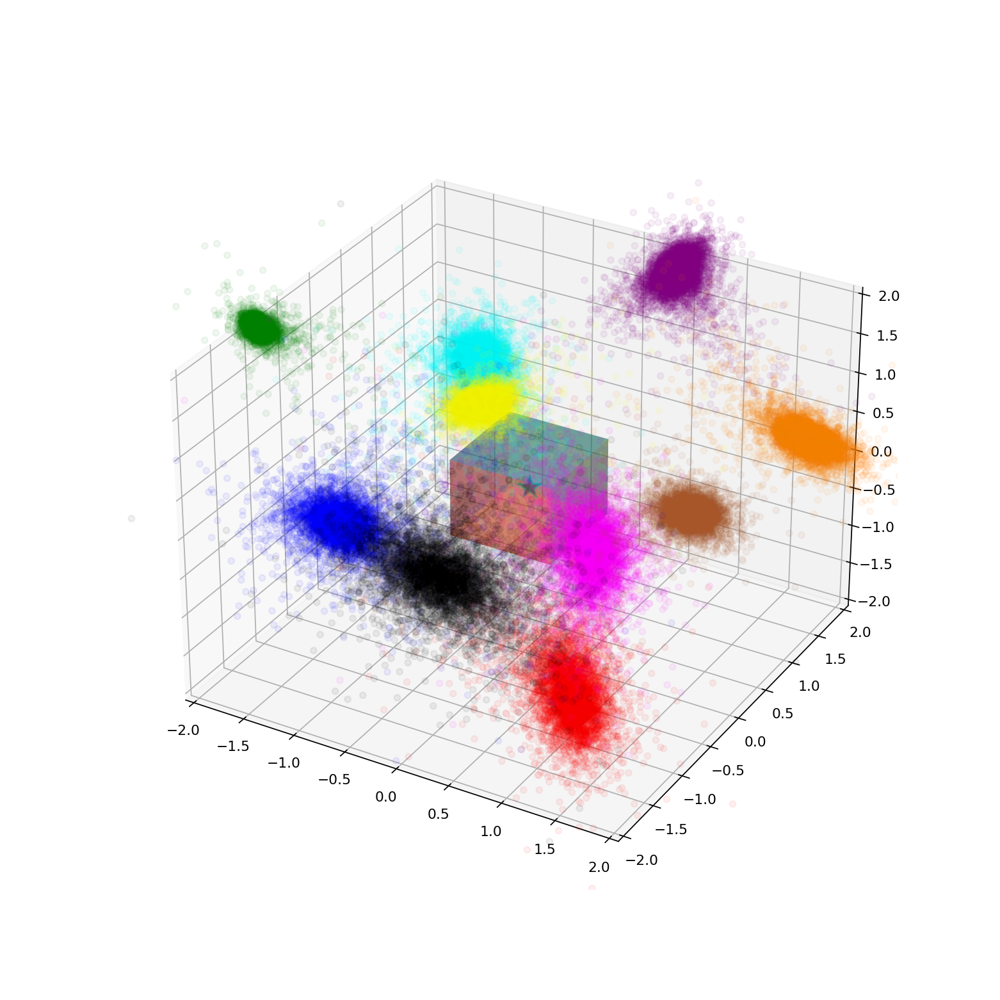

3
Dress
cyan
--------------------------------------------------------------------
total_elements 348
クラス 0 は 5 回出現しました。割合は 1.44% です。
クラス 1 は 1 回出現しました。割合は 0.29% です。
クラス 2 は 17 回出現しました。割合は 4.89% です。
クラス 3 は 73 回出現しました。割合は 20.98% です。
クラス 4 は 154 回出現しました。割合は 44.25% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 96 回出現しました。割合は 27.59% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 2 回出現しました。割合は 0.57% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:44.252873563218394
max_index:4
解答は3となる
インデックスは266


<IPython.core.display.Javascript object>


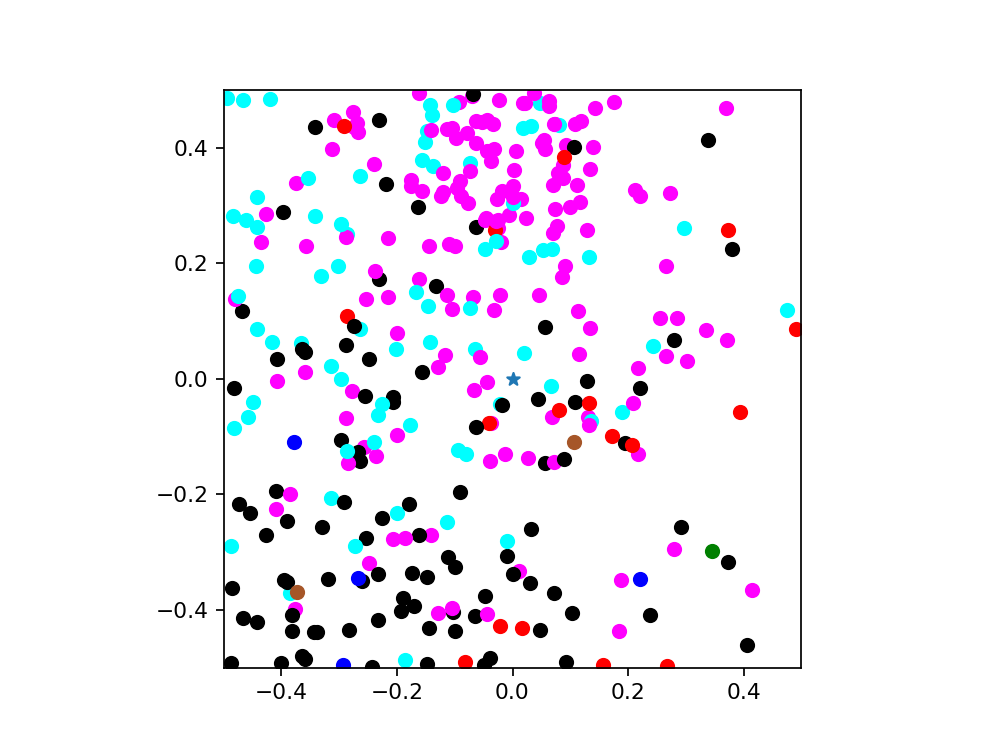

<IPython.core.display.Javascript object>


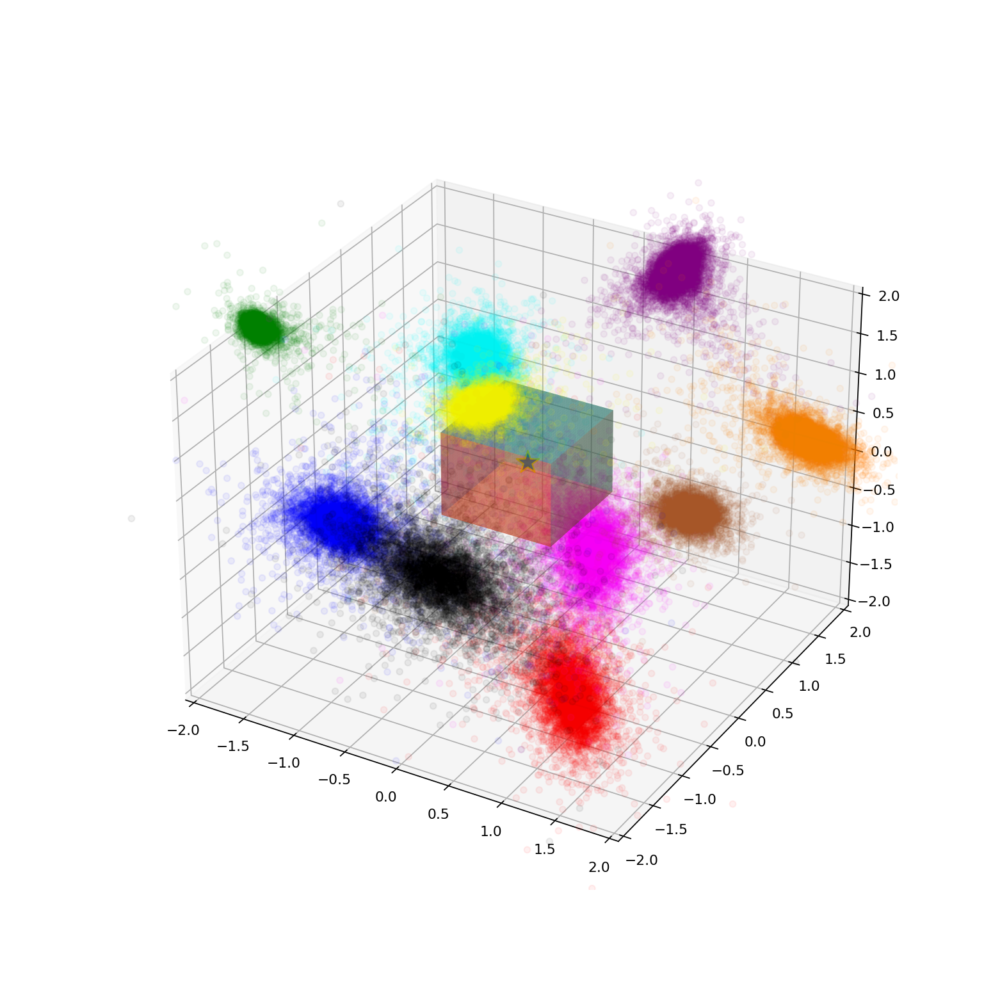

5
Sandal
yellow
--------------------------------------------------------------------
total_elements 597
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 0 回出現しました。割合は 0.00% です。
クラス 5 は 597 回出現しました。割合は 100.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:100.0
max_index:5
解答は5となる
インデックスは11


<IPython.core.display.Javascript object>


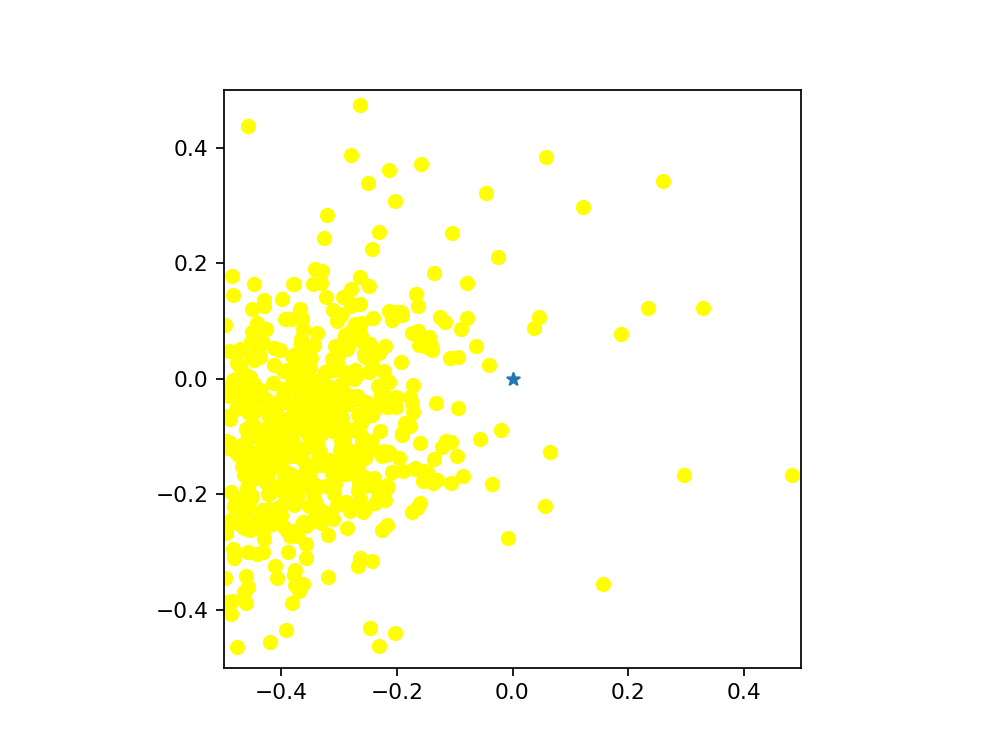

<IPython.core.display.Javascript object>


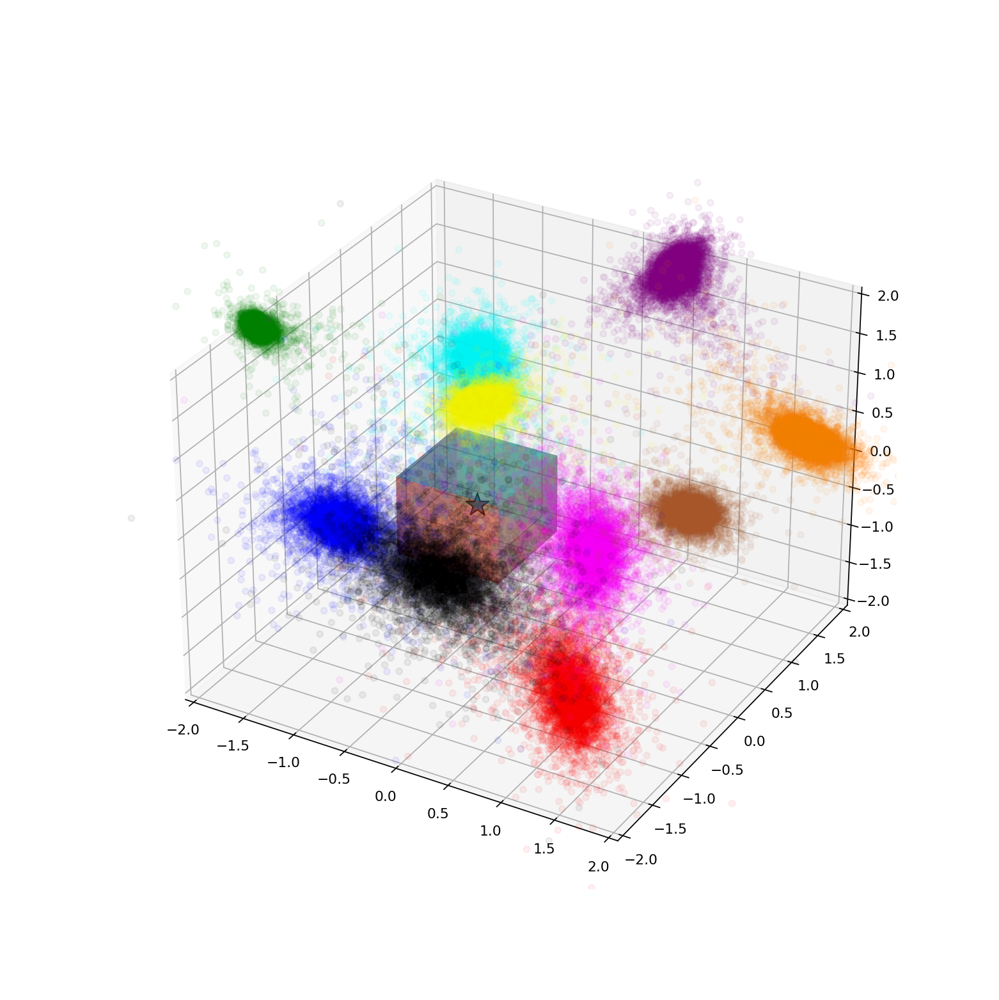

6
Shirt
black
--------------------------------------------------------------------
total_elements 634
クラス 0 は 55 回出現しました。割合は 8.68% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 16 回出現しました。割合は 2.52% です。
クラス 3 は 33 回出現しました。割合は 5.21% です。
クラス 4 は 23 回出現しました。割合は 3.63% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 503 回出現しました。割合は 79.34% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 4 回出現しました。割合は 0.63% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:79.33753943217665
max_index:6
解答は6となる
インデックスは269


<IPython.core.display.Javascript object>


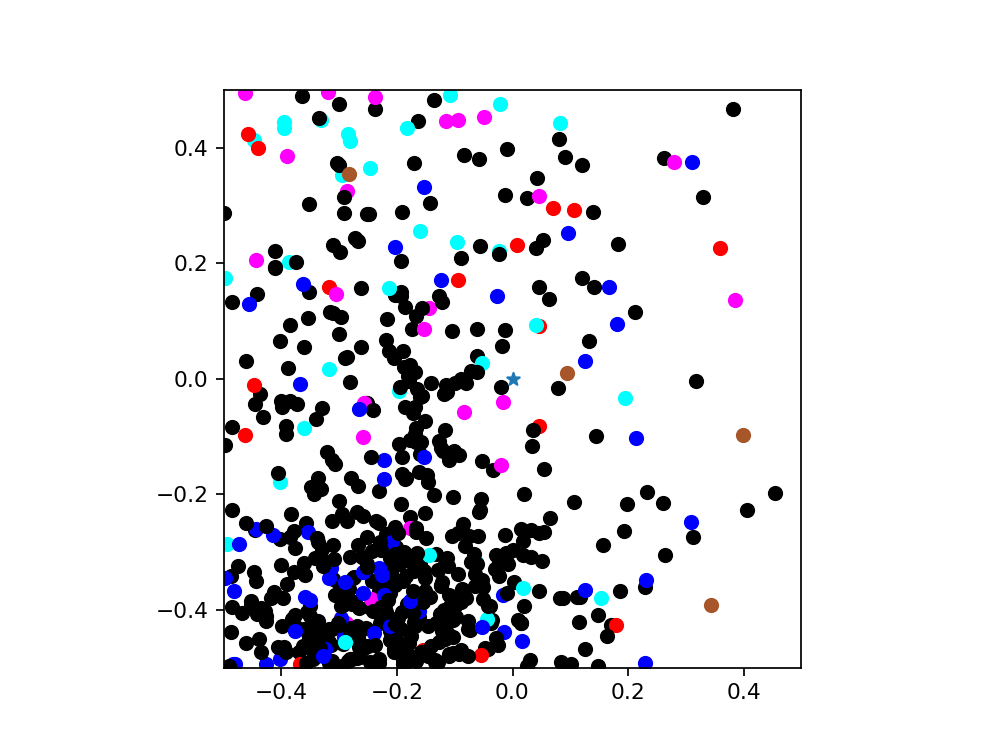

<IPython.core.display.Javascript object>


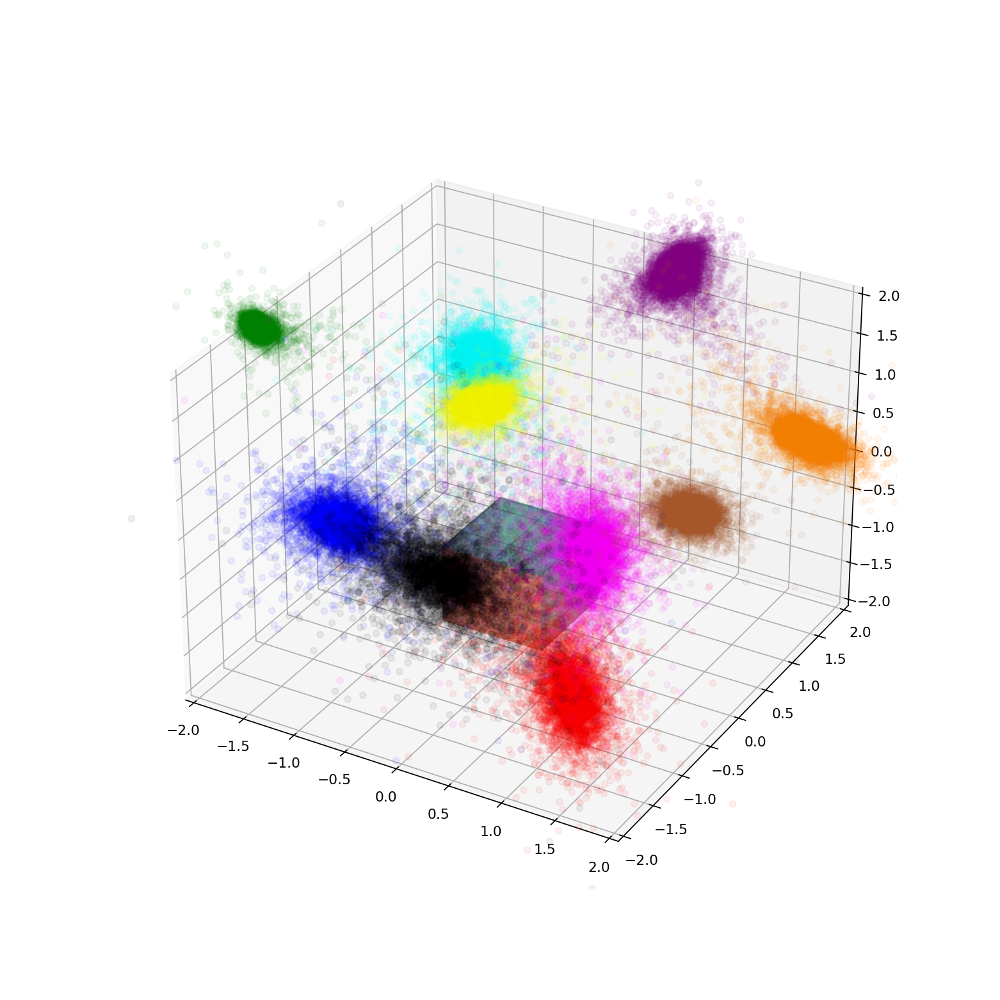

4
Coat
magenta
--------------------------------------------------------------------
total_elements 1501
クラス 0 は 2 回出現しました。割合は 0.13% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 95 回出現しました。割合は 6.33% です。
クラス 3 は 5 回出現しました。割合は 0.33% です。
クラス 4 は 1096 回出現しました。割合は 73.02% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 303 回出現しました。割合は 20.19% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:73.01798800799467
max_index:4
解答は4となる
インデックスは526


<IPython.core.display.Javascript object>


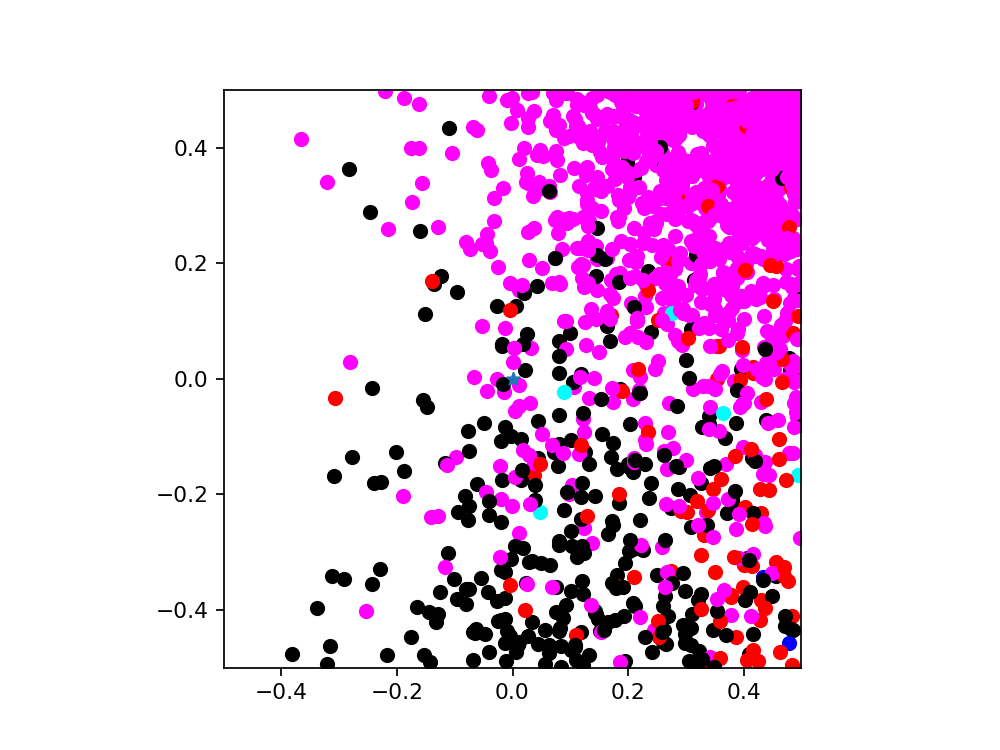

<IPython.core.display.Javascript object>


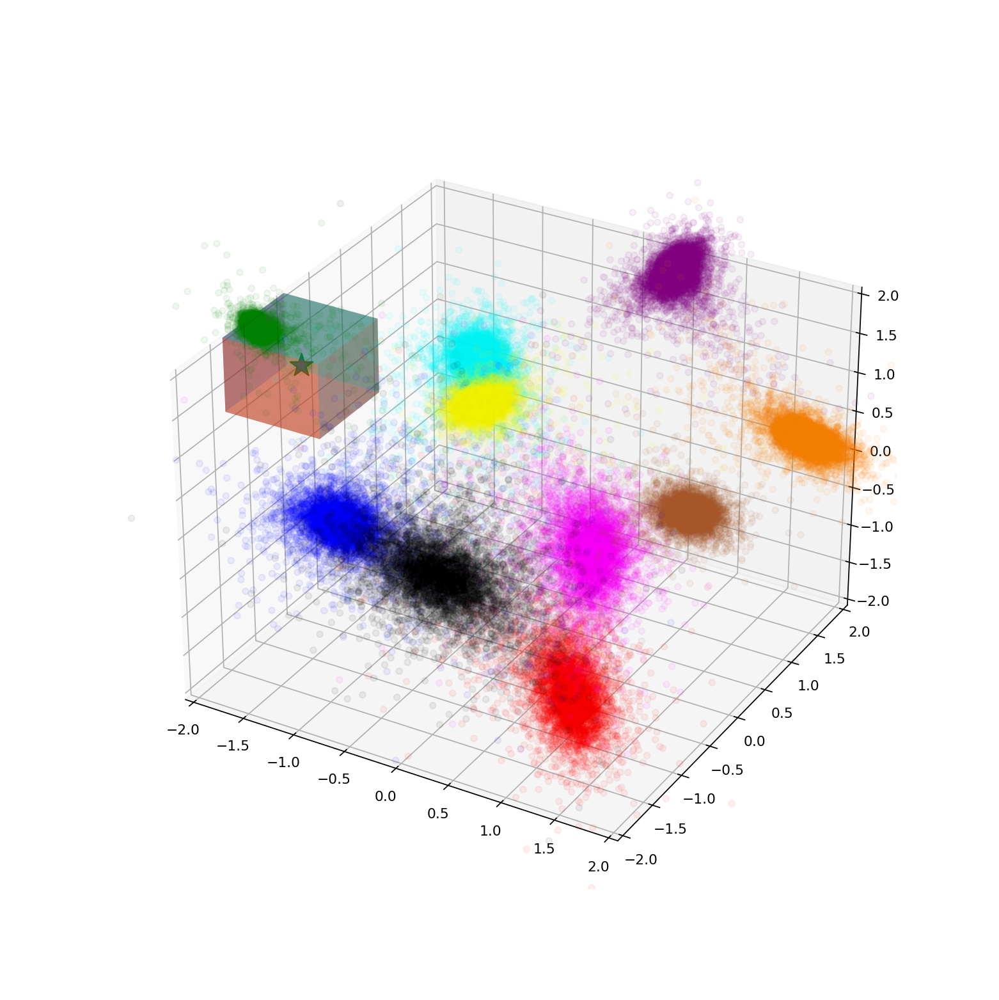

1
Trouser
green
--------------------------------------------------------------------
total_elements 3825
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 3823 回出現しました。割合は 99.95% です。
クラス 2 は 0 回出現しました。割合は 0.00% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 2 回出現しました。割合は 0.05% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 0 回出現しました。割合は 0.00% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:99.94771241830065
max_index:1
解答は1となる
インデックスは782


<IPython.core.display.Javascript object>


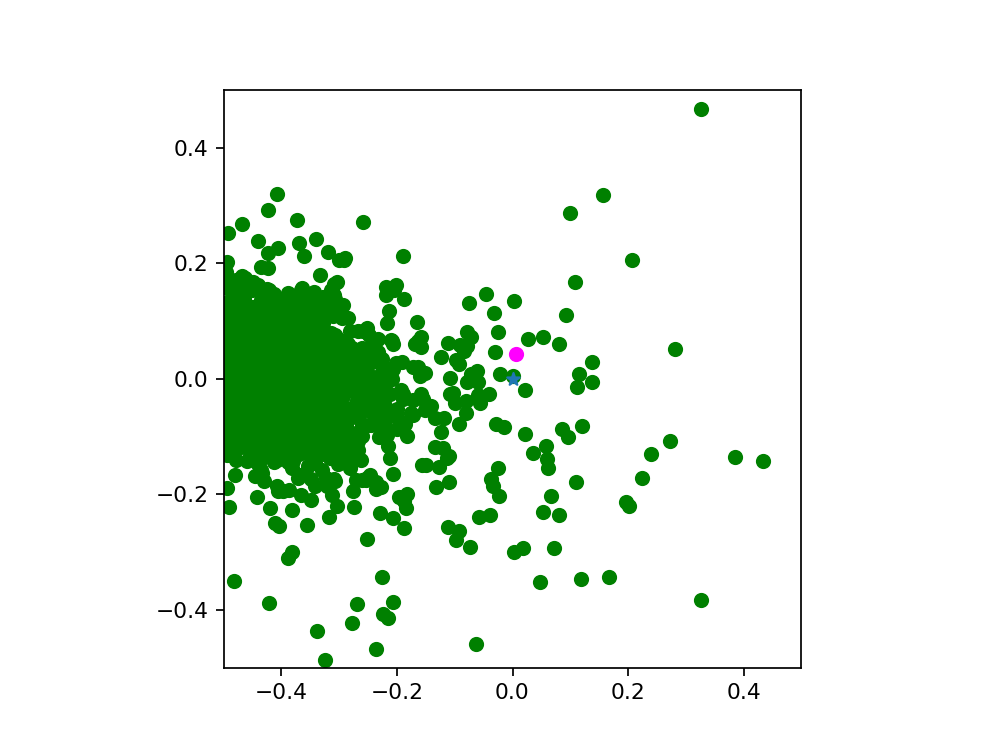

<IPython.core.display.Javascript object>


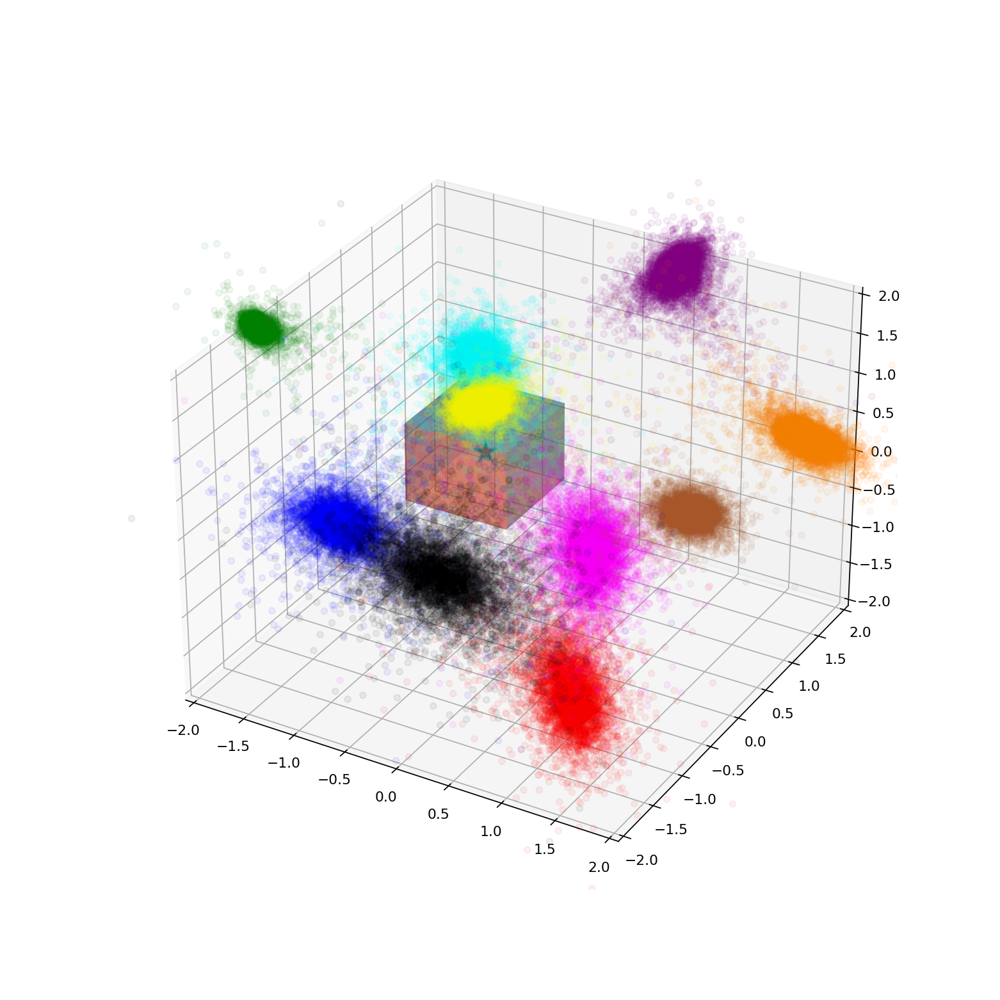

3
Dress
cyan
--------------------------------------------------------------------
total_elements 580
クラス 0 は 21 回出現しました。割合は 3.62% です。
クラス 1 は 1 回出現しました。割合は 0.17% です。
クラス 2 は 11 回出現しました。割合は 1.90% です。
クラス 3 は 451 回出現しました。割合は 77.76% です。
クラス 4 は 18 回出現しました。割合は 3.10% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 75 回出現しました。割合は 12.93% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 3 回出現しました。割合は 0.52% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:77.75862068965517
max_index:3
解答は3となる
インデックスは271


<IPython.core.display.Javascript object>


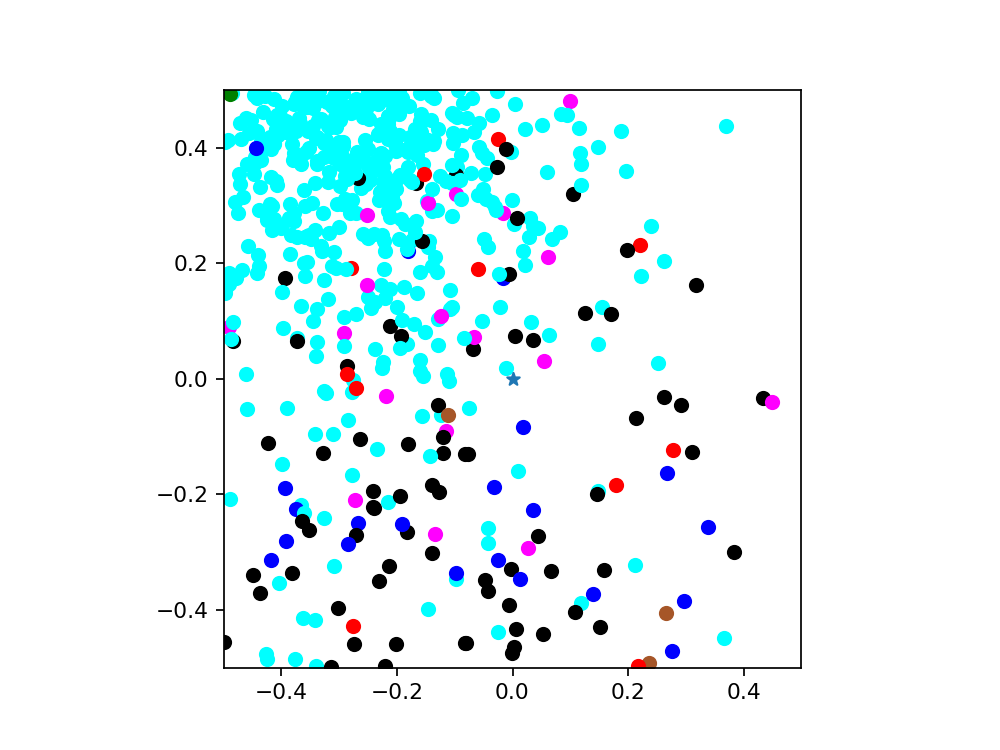

<IPython.core.display.Javascript object>


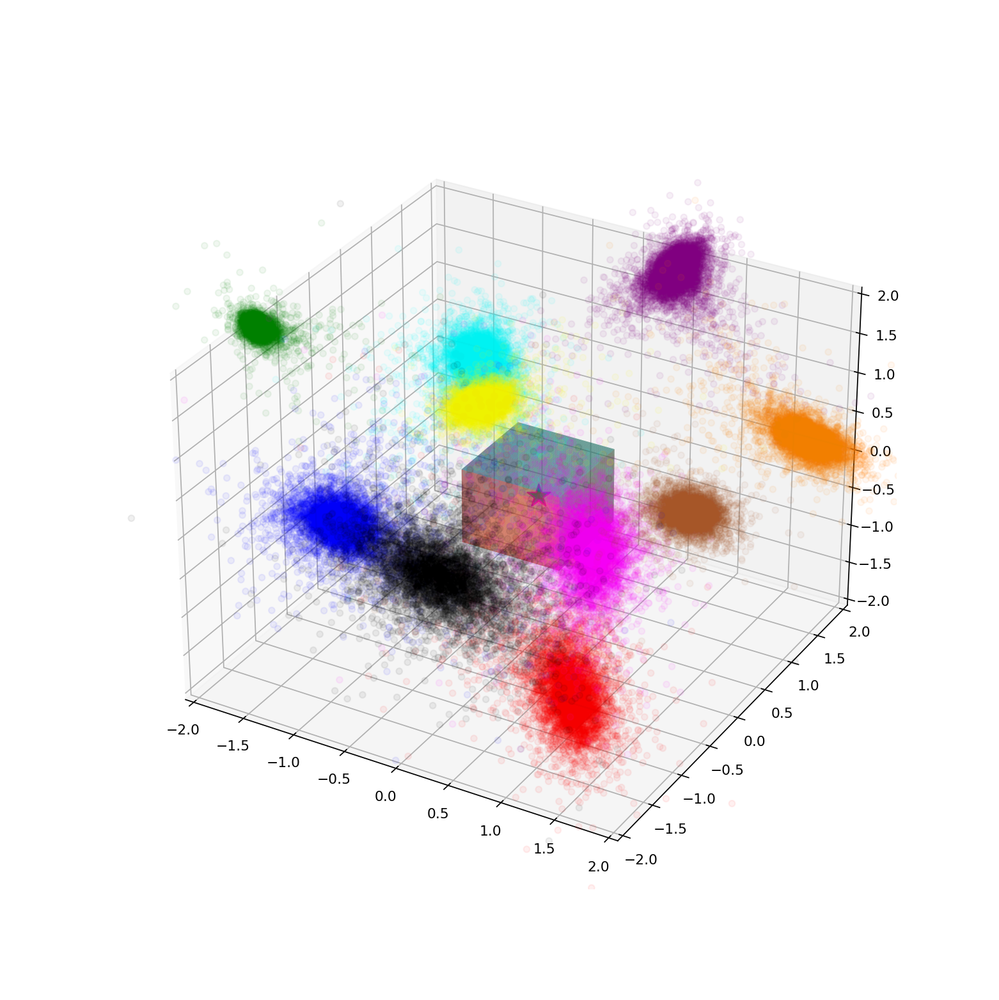

4
Coat
magenta
--------------------------------------------------------------------
total_elements 198
クラス 0 は 0 回出現しました。割合は 0.00% です。
クラス 1 は 0 回出現しました。割合は 0.00% です。
クラス 2 は 3 回出現しました。割合は 1.52% です。
クラス 3 は 0 回出現しました。割合は 0.00% です。
クラス 4 は 194 回出現しました。割合は 97.98% です。
クラス 5 は 0 回出現しました。割合は 0.00% です。
クラス 6 は 1 回出現しました。割合は 0.51% です。
クラス 7 は 0 回出現しました。割合は 0.00% です。
クラス 8 は 0 回出現しました。割合は 0.00% です。
クラス 9 は 0 回出現しました。割合は 0.00% です。
--------------------------------------------------------------------
max_value:97.97979797979798
max_index:4
解答は4となる
インデックスは17


C:\Users\y9723\anaconda3\lib\site-packages\ipykernel_launcher.py:111: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


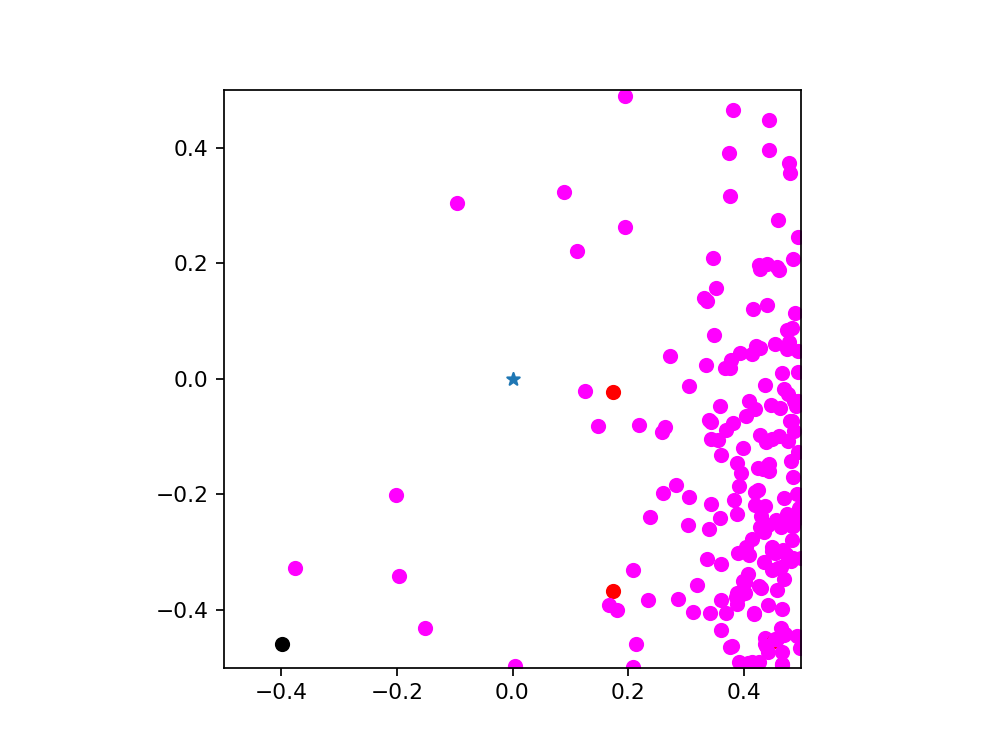

In [130]:
# 可視化
for select in range(10):
# select=1

    # rcParams['figure.figsize'] = 10, 10

    test_radius=[0.5]

    test_ra=test_radius[0]

    x = np.linspace(-test_ra, test_ra, 100)
    y = np.linspace(-test_ra, test_ra, 100)
    X, Y = np.meshgrid(x, y)
    Z1 = np.ones_like(X)
    Z2 = -1 * np.ones_like(X)


    fig=plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(z_test_np[true_conditions_indices[select], 0], z_test_np[true_conditions_indices[select], 1], z_test_np[true_conditions_indices[select], 2], s=300, marker="*", edgecolors=colors[y_test_np[true_conditions_indices[select]]])
    x_prime=z_test_np[true_conditions_indices[select], 0]
    y_prime=z_test_np[true_conditions_indices[select], 1]
    z_prime=z_test_np[true_conditions_indices[select], 2]
    ax.plot_surface(X+x_prime, Y+y_prime, Z1+z_prime-1+test_ra, alpha=0.4)
    ax.plot_surface(X+x_prime, Y+y_prime, Z2+z_prime+1-test_ra, alpha=0.4)
    ax.plot_surface(X+x_prime, test_ra+y_prime, Y+z_prime, alpha=0.4)
    ax.plot_surface(X+x_prime, -test_ra+y_prime, Y+z_prime, alpha=0.4)
    ax.plot_surface(test_ra+x_prime, X+y_prime, Y+z_prime, alpha=0.4)
    ax.plot_surface(-test_ra+x_prime, X+y_prime, Y+z_prime, alpha=0.4)

    for i in range(class_num):    ax.scatter(z_valid_np[y_valid_np==i, 0], z_valid_np[y_valid_np==i, 1], z_valid_np[y_valid_np==i, 2], color=colors[i], label=class_names[i], alpha=0.06)


    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_zlim(-2, 2)

    plt.show()

    # クラス名
    class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']
    # クラス数
    class_num=len(class_names)
    # 事前に定義された10色のリスト
    colors = ["blue","green","red","cyan","magenta","yellow","black",'purple','#a65628','#ff7f00']

    print(y_test_np[true_conditions_indices[select]])
    print(class_names[y_test_np[true_conditions_indices[select]]])
    print(colors[y_test_np[true_conditions_indices[select]]])

    print("--------------------------------------------------------------------")

    # 割合の表示

    sample_data = [np.empty((60000, 3))]

    sample_label=[np.empty((60000))]
    sample_data

    # for l in range(true_conditions_indices[select]):
    l=true_conditions_indices[select]
    # 四角形内か否かを判定
    array=(z_test_np[l]-test_radius[index] < z_valid_np) & (z_valid_np < z_test_np[l]+test_radius[index])
    #     print(array.shape)
    array1=array.all(axis=1)
    array2=z_valid_np[array1] 
#     print(array2.shape)
    # 1103
    sample_data=array2
    total_elements=array2.shape[0]
    print("total_elements",total_elements)
    # # 1114の条件付け加え
    # if total_elements > 1000:
    #     abc.append(l)
    # labelの確認
    array3=y_valid_np[array1]
    # 1103
    sample_label=array3
#     print(array3.shape)
    counts=np.bincount(array3, minlength=10)
    # 結果の表示
    for i in range(10):
        if total_elements==0:
            percentage[i] = (counts[i] / total_elements) * 100
            percentage[i]=0.0
            counts[i]=0
        else:
            percentage[i] = (counts[i] / total_elements) * 100
        print(f"クラス {i} は {counts[i]} 回出現しました。割合は {percentage[i]:.2f}% です。")
    print("--------------------------------------------------------------------")
    # percentageがpara%を超えていればそのラベルを予測ラベルとし、そうでない場合は、他のラベルの割合比べたり、不可能ラベルとしたり
    #     条件分岐
    max_value = np.max(percentage)
    print(f"max_value:{max_value}")
    max_index = np.argmax(percentage)
    print(f"max_index:{max_index}")
    print(f"解答は{y_test_np[l]}となる")
    print(f"インデックスは{l}")

    #
    # 正方形の一辺の長さ
    side_length = 2*test_ra

    x = np.linspace(test_ra, test_ra, 100)
    y = np.linspace(test_ra, test_ra, 100)
    X, Y = np.meshgrid(x, y)

    # Z座標をすべて0に設定
    Z = np.zeros_like(X)

    fig = plt.figure()
    ax = fig.add_subplot(111)

    # 正方形をプロット
    ax.contourf(X, Y, Z, levels=[-test_ra*2, test_ra*2], colors=['none'])



    for i in range(sample_data.shape[0]):
        data_x=sample_data[i, 0]-z_test_np[true_conditions_indices[select], 0]
        data_y=sample_data[i, 1]-z_test_np[true_conditions_indices[select], 1]
        data_z=sample_data[i, 2]-z_test_np[true_conditions_indices[select], 2]
        ax.scatter(data_x, data_y, color=colors[sample_label[i]])

    ax.set_xlim(-side_length / 2, side_length / 2)
    ax.set_ylim(-side_length / 2, side_length / 2)
    ax.scatter(0, 0, marker="*")

    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()